In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import requests

## Collecting and Pre-processing data

"household_power_consumption.txt" is a text file of a residential household energy usage with data presented in text format separated with ";"

Data Shape = **2075261 rows** and **11 columns**

The data is gathered from January 2022 (2022-01-02) to December 2025 (2025-12-12)

Notes:

1. (global_active_power*1000/60 - sub_metering_1 - sub_metering_2 - sub_metering_3) represents the active energy consumed every minute (in watt hour) in the household by electrical equipment not measured in sub-meterings 1, 2 and 3.

2. The dataset contains some missing values in the measurements (nearly 1,25% of the rows). All calendar timestamps are present in the dataset but for some timestamps, the measurement values are missing: a missing value is represented by the absence of value between two consecutive semi-colon attribute separators.

3. Dataset is manipulated to span till 2025-12-12 by same day of week to gather futute data.

Attribute Information:

1. **date**: Date in format dd/mm/yyyy

2. **time**: time in format hh:mm:ss

3. **global_active_power**: household global minute-averaged active power (in kilowatt)

4. **global_reactive_power**: household global minute-averaged reactive power (in kilowatt)

5. **voltage**: minute-averaged voltage (in volt)

6. **global_intensity**: household global minute-averaged current intensity (in ampere)

7. **sub_metering_1**: energy sub-metering No. 1 (in watt-hour of active energy). It corresponds to the kitchen, containing mainly a dishwasher, an oven and a microwave (hot plates are not electric but gas powered).

8. **sub_metering_2**: energy sub-metering No. 2 (in watt-hour of active energy). It corresponds to the laundry room, containing a washing-machine, a tumble-drier, a refrigerator and a light.

9. **sub_metering_3**: energy sub-metering No. 3 (in watt-hour of active energy). It corresponds to an electric water-heater and an air-conditioner.

In [2]:
# File paths
text_file = "C:/Users/vishw/Projects/Solaris/datasets/energy_usage.txt"                     # Input text file
pwr_file = "C:/Users/vishw/Projects/Solaris/datasets/energy_usage.csv"                      # Output energy CSV file
pwr_hr_file = "C:/Users/vishw/Projects/Solaris/datasets/energy_usage_hrly.csv"              # Output hourly energy CSV file
wthr_file = "C:/Users/vishw/Projects/Solaris/datasets/weather_data.csv"                     # Weather CSV file
pwr_hr_wthr_file = "C:/Users/vishw/Projects/Solaris/datasets/household_energy_data.csv"     # Output houryl energy with weather CSV file

## Conversion and manipulation of txt file to csv file

1. Processing and converting *"energy_usage.txt"* file to *"energy_usage.csv"*
        Filling the missing(*null*) and NA values with forward fill ```.ffill()``` (Filling with last/previous valid value)

2. Converting minute-wise data in *"energy_uasge.csv"* to hourly data with average of the hour *"energy_usage_hrly.csv"*

3. Adding weather data *weather_data.csv* of the particular hour from *open-meteo.com* historical data API from **2022-01-02** to **2025-03-24**

**Weather metrics**: Temperature, Humidity, Precipitation, Wind Speed, Wind Direction, Solar Irradiance (GHI)

4. Final dataset formed with energy data and weather data spanning from **2022-01-02** to **2025-03-24** (Hourly) *energy_usage_data.csv*

In [3]:
# Column names and data types for memory optimization
col_types = {
    "date" : "str",
    "time" : "str",
    "Global_active_power" : "float32",
    "Global_reactive_power" : "float32",
    "Voltage" : "float32",
    "Global_intensity" : "float32",
    "Sub_metering_1" : "float32",
    "Sub_metering_2" : "float32",
    "Sub_metering_3" : "float32",
}

In [4]:
# Load data with appropriate column types and parse datetime
text_forecast_df = pd.read_csv(
    text_file,
    sep = ";",
    dtype = col_types,
    na_values = ['?',''],
    keep_default_na = False,
    low_memory = False,
)

In [5]:
text_forecast_df.head()

,Date,Time,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
0,16/12/2006,17:24:00,4.216,0.418,234.839996,18.4,0.0,1.0,17.0
1,16/12/2006,17:25:00,5.360,0.436,233.630005,23.0,0.0,1.0,16.0
2,16/12/2006,17:26:00,5.374,0.498,233.289993,23.0,0.0,2.0,17.0
3,16/12/2006,17:27:00,5.388,0.502,233.740005,23.0,0.0,1.0,17.0
4,16/12/2006,17:28:00,3.666,0.528,235.679993,15.8,0.0,1.0,17.0


In [6]:
text_forecast_df.tail()

,Date,Time,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
2075254,26/11/2010,20:58:00,0.946,0.0,240.429993,4.0,0.0,0.0,0.0
2075255,26/11/2010,20:59:00,0.944,0.0,240.000000,4.0,0.0,0.0,0.0
2075256,26/11/2010,21:00:00,0.938,0.0,239.820007,3.8,0.0,0.0,0.0
2075257,26/11/2010,21:01:00,0.934,0.0,239.699997,3.8,0.0,0.0,0.0
2075258,26/11/2010,21:02:00,0.932,0.0,239.550003,3.8,0.0,0.0,0.0


In [7]:
text_forecast_df.shape

(2075259, 9)

In [8]:
text_forecast_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075259 entries, 0 to 2075258
Data columns (total 9 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   Date                   object 
 1   Time                   object 
 2   Global_active_power    float32
 3   Global_reactive_power  float32
 4   Voltage                float32
 5   Global_intensity       float32
 6   Sub_metering_1         float32
 7   Sub_metering_2         float32
 8   Sub_metering_3         float32
dtypes: float32(7), object(2)
memory usage: 87.1+ MB


In [9]:
# Find the index of the first occurrence of '00:00:00' in the 'time' column
first_midnight_index = text_forecast_df[text_forecast_df['Time'] == '00:00:00'].index[0]

# Keep only the rows from the first occurrence of '00:00:00' onwards
text_forecast_df = text_forecast_df.iloc[first_midnight_index:].reset_index(drop = True)

In [10]:
text_forecast_df.head()

,Date,Time,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
0,17/12/2006,00:00:00,1.044,0.152,242.729996,4.4,0.0,2.0,0.0
1,17/12/2006,00:01:00,1.520,0.220,242.199997,7.4,0.0,1.0,0.0
2,17/12/2006,00:02:00,3.038,0.194,240.139999,12.6,0.0,2.0,0.0
3,17/12/2006,00:03:00,2.974,0.194,239.970001,12.4,0.0,1.0,0.0
4,17/12/2006,00:04:00,2.846,0.198,240.389999,11.8,0.0,2.0,0.0


In [11]:
# Merge Date and Time into a single datetime column
text_forecast_df['Datetime'] = pd.to_datetime(text_forecast_df['Date'] + ' ' + text_forecast_df['Time'], format='%d/%m/%Y %H:%M:%S')

In [12]:
# Mainpulating the Date to 2022-01-02 by adding 474768000000000000 to UNIX time
text_forecast_df['Datetime'] = (pd.to_datetime(text_forecast_df['Datetime']).astype('int64')) + 474768000000000000
text_forecast_df['Datetime'] = pd.to_datetime(text_forecast_df['Datetime'], unit = 'ns')

# Droping Date and Time columns
text_forecast_df.drop(columns = ['Date', 'Time'], inplace = True)

# Set the datetime column as the index
text_forecast_df.set_index('Datetime', inplace = True)

In [13]:
text_forecast_df.head()

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
Datetime,,,,,,,
2022-01-02 00:00:00,1.044,0.152,242.729996,4.4,0.0,2.0,0.0
2022-01-02 00:01:00,1.520,0.220,242.199997,7.4,0.0,1.0,0.0
2022-01-02 00:02:00,3.038,0.194,240.139999,12.6,0.0,2.0,0.0
2022-01-02 00:03:00,2.974,0.194,239.970001,12.4,0.0,1.0,0.0
2022-01-02 00:04:00,2.846,0.198,240.389999,11.8,0.0,2.0,0.0


In [14]:
text_forecast_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2074863 entries, 2022-01-02 00:00:00 to 2025-12-12 21:02:00
Data columns (total 7 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   Global_active_power    float32
 1   Global_reactive_power  float32
 2   Voltage                float32
 3   Global_intensity       float32
 4   Sub_metering_1         float32
 5   Sub_metering_2         float32
 6   Sub_metering_3         float32
dtypes: float32(7)
memory usage: 71.2 MB


In [15]:
#Checking for null values
text_forecast_df.isnull().sum()

Global_active_power      25979
Global_reactive_power    25979
Voltage                  25979
Global_intensity         25979
Sub_metering_1           25979
Sub_metering_2           25979
Sub_metering_3           25979
dtype: int64

In [16]:
# Filling null valeus with the previous value (Forward fill)
text_forecast_df.ffill(inplace=True)

In [17]:
# Create a new column 'sub_metering_4' using the given formula
text_forecast_df['Sub_metering_4'] = (text_forecast_df['Global_active_power'] * 1000 / 60) - text_forecast_df['Sub_metering_1'] - text_forecast_df['Sub_metering_2'] - text_forecast_df['Sub_metering_3']

In [18]:
text_forecast_df.head()

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3,Sub_metering_4
Datetime,,,,,,,,
2022-01-02 00:00:00,1.044,0.152,242.729996,4.4,0.0,2.0,0.0,15.400000
2022-01-02 00:01:00,1.520,0.220,242.199997,7.4,0.0,1.0,0.0,24.333334
2022-01-02 00:02:00,3.038,0.194,240.139999,12.6,0.0,2.0,0.0,48.633335
2022-01-02 00:03:00,2.974,0.194,239.970001,12.4,0.0,1.0,0.0,48.566666
2022-01-02 00:04:00,2.846,0.198,240.389999,11.8,0.0,2.0,0.0,45.433334


In [19]:
text_forecast_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2074863 entries, 2022-01-02 00:00:00 to 2025-12-12 21:02:00
Data columns (total 8 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   Global_active_power    float32
 1   Global_reactive_power  float32
 2   Voltage                float32
 3   Global_intensity       float32
 4   Sub_metering_1         float32
 5   Sub_metering_2         float32
 6   Sub_metering_3         float32
 7   Sub_metering_4         float32
dtypes: float32(8)
memory usage: 79.1 MB


In [20]:
# Save the result as a CSV file
text_forecast_df.to_csv(pwr_file, index = True)

In [21]:
# Resample data to hourly and compute averages
forecast_df_hourly = text_forecast_df.resample("h").agg( {
    'Global_active_power' : 'mean',
    'Global_reactive_power' : 'mean',
    'Voltage' : 'mean',
    'Global_intensity' : 'mean',
    'Sub_metering_1' : 'sum',
    'Sub_metering_2' : 'sum',
    'Sub_metering_3' : 'sum',
    'Sub_metering_4' : 'sum'
} ).reset_index()

# Set the datetime column as the index
forecast_df_hourly.set_index('Datetime', inplace = True)

In [22]:
forecast_df_hourly.head()

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3,Sub_metering_4
Datetime,,,,,,,,
2022-01-02 00:00:00,1.882467,0.102433,240.961838,8.126667,0.0,28.0,0.0,1854.466675
2022-01-02 01:00:00,3.349400,0.136933,240.448334,14.246667,0.0,1514.0,0.0,1835.400024
2022-01-02 02:00:00,1.587267,0.078233,245.818665,6.870000,0.0,34.0,0.0,1553.266602
2022-01-02 03:00:00,1.662200,0.079533,244.513489,7.206666,0.0,46.0,0.0,1616.199951
2022-01-02 04:00:00,2.215767,0.093467,243.855499,9.333333,0.0,34.0,533.0,1648.766602


In [23]:
forecast_df_hourly.tail()

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3,Sub_metering_4
Datetime,,,,,,,,
2025-12-12 17:00:00,1.725900,0.061400,237.069656,7.216667,0.0,0.0,772.0,953.900024
2025-12-12 18:00:00,1.573467,0.053700,237.531830,6.620000,0.0,0.0,0.0,1573.466675
2025-12-12 19:00:00,1.659333,0.060033,236.740997,7.056666,0.0,4.0,0.0,1655.333374
2025-12-12 20:00:00,1.163700,0.061167,239.395996,4.913333,0.0,64.0,0.0,1099.699951
2025-12-12 21:00:00,0.934667,0.000000,239.690002,3.800000,0.0,0.0,0.0,46.733334


In [24]:
forecast_df_hourly.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 34582 entries, 2022-01-02 00:00:00 to 2025-12-12 21:00:00
Data columns (total 8 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Global_active_power    34582 non-null  float32
 1   Global_reactive_power  34582 non-null  float32
 2   Voltage                34582 non-null  float32
 3   Global_intensity       34582 non-null  float32
 4   Sub_metering_1         34582 non-null  float32
 5   Sub_metering_2         34582 non-null  float32
 6   Sub_metering_3         34582 non-null  float32
 7   Sub_metering_4         34582 non-null  float32
dtypes: float32(8)
memory usage: 1.3 MB


In [25]:
forecast_df_hourly.describe()

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3,Sub_metering_4
count,34582.000000,34582.000000,34582.000000,34582.000000,34582.000000,34582.000000,34582.000000,34582.000000
mean,1.085789,0.123331,240.842453,4.602586,66.670578,77.274330,384.914673,556.903442
std,0.894507,0.067223,2.998469,3.744393,211.129105,250.141159,440.657654,494.070557
min,0.124000,0.000000,225.834503,0.503333,0.000000,0.000000,0.000000,46.733334
25%,0.341267,0.077667,239.199539,1.510000,0.000000,0.000000,39.000000,261.100006
50%,0.799100,0.106767,240.985001,3.406667,0.000000,20.000000,99.000000,344.500000
75%,1.574592,0.149367,242.692123,6.580000,0.000000,39.000000,844.000000,666.958344
max,6.560533,0.774333,251.902008,28.383333,2902.000000,2786.000000,1293.000000,3890.233398


In [26]:
forecast_df_hourly.isnull().sum()

Global_active_power      0
Global_reactive_power    0
Voltage                  0
Global_intensity         0
Sub_metering_1           0
Sub_metering_2           0
Sub_metering_3           0
Sub_metering_4           0
dtype: int64

In [28]:
# Save the result as a hourly CSV file
forecast_df_hourly.to_csv(pwr_hr_file, index = True)

## Historical Data Collection

Historical data is collected from open-meteo.com website for City of Hyderabad, Telanagana, India (Latitude = 17.401427, Longitude = 78.560246)

API for historic data = https://archive-api.open-meteo.com/v1/era5?latitude={lat}&longitude={lon}&start_date={start_date}&end_date={end_date}&temperature_2m,relative_humidity_2m,precipitation,cloud_cover,wind_speed_100m,wind_direction_100m,is_day,shortwave_radiation&timezone={time_zone}&tilt={tilt}

Data range = **02-01-2022** to **24-03-2025**

Latitude = **17.401427**

Longitude = **78.560246**

Solar Panel Tilt Angle = **17 Degrees** (Optimized for year round solar usage for Hyderabad, TG, IN)

Time Zone = **Indian Standard Time(IST)** A.K.A Asia/Kolkata (GMT + 5:30 Hour)

File name = *weather_data.csv*

API example : https://archive-api.open-meteo.com/v1/archive?latitude=17.401427&longitude=78.560246&start_date=2022-01-02&end_date=2025-03-24&hourly=temperature_2m,relative_humidity_2m,precipitation,cloud_cover,wind_speed_10m,wind_direction_10m,is_day,shortwave_radiation,global_tilted_irradiance&timezone=Asia/Kolkata&tilt=17

## Forecast Data Collection

Historical data is collected from open-meteo.com website for City of Hyderabad, TG, IN (Latitude = 17.401427, Longitude = 78.560246)

API for forecast data : https://api.open-meteo.com/v1/forecast?latitude={lat}&longitude={lon}&hourly=temperature_2m,relative_humidity_2m,precipitation_probability,precipitation,cloud_cover,wind_speed_10m,wind_direction_10m,is_day,shortwave_radiation,global_tilted_irradiance&timezone={time_zone}&tilt={tilt}

API Example : https://api.open-meteo.com/v1/forecast?latitude=17.401427&longitude=78.560246&hourly=temperature_2m,relative_humidity_2m,precipitation_probability,precipitation,cloud_cover,wind_speed_10m,wind_direction_10m,is_day,shortwave_radiation,global_tilted_irradiance&timezone=Asia/Kolkata&tilt=17

Weather metrics:

1. **temperature** (Celcius) = Air temperature at 2 meters above ground

2. **humidity** % = Relative humidity at 2 meters above ground

3. **precipitation** (mm) = Total precipitation (rain, showers, snow) sum of the preceding hour. Data is stored with a 0.1 mm precision. If precipitation data is summed up to monthly sums, there might be small inconsistencies with the total precipitation amount.

4. **cloud_cover** % = Total cloud cover as an area fraction.

5. **wind_speed** Km/h = Wind speed at 10 meters above ground.

6. **wind_direction** = Wind direction at 10 meters above ground.

7. **is_day** [0,1] = 1 if the current time step has daylight, 0 at night.

8. **GHI** W/m^2 (Global Horizontal Irradiation) = Shortwave solar radiation as average of the preceding hour. This is equal to the total global horizontal irradiation. Global Horizontal Irradiation (GHI).

9. **GTI** W/m^2 (Global Tilted Irradiation) = Total radiation received on a tilted pane as average of the preceding hour. The calculation is assuming a fixed albedo of 20% and in isotropic sky.

In [29]:
api_url = "https://archive-api.open-meteo.com/v1/archive?latitude=17.401427&longitude=78.560246&start_date=2022-01-02&end_date=2025-03-24&hourly=temperature_2m,relative_humidity_2m,precipitation,cloud_cover,wind_speed_10m,wind_direction_10m,is_day,shortwave_radiation,global_tilted_irradiance&timezone=Asia/Kolkata&tilt=17"
response = requests.get(api_url)
data = response.json()

weather_forecast_df = pd.DataFrame(data['hourly'])

In [30]:
weather_forecast_df['time'] = pd.to_datetime(weather_forecast_df['time'])
weather_forecast_df.set_index('time', inplace = True)

In [31]:
weather_forecast_df.columns

Index(['temperature_2m', 'relative_humidity_2m', 'precipitation',
       'cloud_cover', 'wind_speed_10m', 'wind_direction_10m', 'is_day',
       'shortwave_radiation', 'global_tilted_irradiance'],
      dtype='object')

In [32]:
weather_forecast_df.rename(columns = {
    'temperature_2m' : 'temperature',
    'relative_humidity_2m' : 'humidity',
    'wind_speed_10m' : 'wind_speed',
    'wind_direction_10m' : 'wind_direction',
    'shortwave_radiation' : 'GHI',
    'global_tilted_irradiance' : 'GTI',
}, inplace = True)

In [33]:
# Converting 64 bit values into 32 bit for faster processing
float_cols = weather_forecast_df.select_dtypes(include=['float64']).columns
int_cols = weather_forecast_df.select_dtypes(include=['int64']).columns

weather_forecast_df[float_cols] = weather_forecast_df[float_cols].astype('float32')
weather_forecast_df[int_cols] = weather_forecast_df[int_cols].astype('int32')

In [34]:
weather_forecast_df.head()

,temperature,humidity,precipitation,cloud_cover,wind_speed,wind_direction,is_day,GHI,GTI
time,,,,,,,,,
2022-01-02 00:00:00,18.5,82,0.0,13,7.3,70,0,0.0,0.0
2022-01-02 01:00:00,18.4,80,0.0,0,5.4,48,0,0.0,0.0
2022-01-02 02:00:00,18.0,79,0.0,0,5.9,43,0,0.0,0.0
2022-01-02 03:00:00,17.4,81,0.0,0,7.7,49,0,0.0,0.0
2022-01-02 04:00:00,17.0,81,0.0,0,7.3,57,0,0.0,0.0


In [35]:
weather_forecast_df.tail()

,temperature,humidity,precipitation,cloud_cover,wind_speed,wind_direction,is_day,GHI,GTI
time,,,,,,,,,
2025-03-24 19:00:00,28.799999,50,0.0,8,4.7,90,0,0.0,0.0
2025-03-24 20:00:00,27.799999,57,0.0,13,3.6,60,0,0.0,0.0
2025-03-24 21:00:00,27.299999,56,0.0,4,5.1,42,0,0.0,0.0
2025-03-24 22:00:00,26.500000,65,0.0,1,3.1,36,0,0.0,0.0
2025-03-24 23:00:00,26.400000,63,0.0,1,0.5,315,0,0.0,0.0


In [36]:
weather_forecast_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 28272 entries, 2022-01-02 00:00:00 to 2025-03-24 23:00:00
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   temperature     28272 non-null  float32
 1   humidity        28272 non-null  int32  
 2   precipitation   28272 non-null  float32
 3   cloud_cover     28272 non-null  int32  
 4   wind_speed      28272 non-null  float32
 5   wind_direction  28272 non-null  int32  
 6   is_day          28272 non-null  int32  
 7   GHI             28272 non-null  float32
 8   GTI             28272 non-null  float32
dtypes: float32(5), int32(4)
memory usage: 1.2 MB


In [37]:
weather_forecast_df.describe()

,temperature,humidity,precipitation,cloud_cover,wind_speed,wind_direction,is_day,GHI,GTI
count,28272.000000,28272.000000,28272.000000,28272.000000,28272.000000,28272.000000,28272.000000,28272.000000,28272.000000
mean,26.140625,61.760434,0.109140,54.658850,10.244854,180.719617,0.503254,222.456390,233.711029
std,4.791505,22.469420,0.554530,43.148473,5.756402,99.618695,0.499998,299.134247,315.716248
min,11.000000,10.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
25%,23.100000,44.000000,0.000000,5.000000,6.200000,96.000000,0.000000,0.000000,0.000000
50%,25.600000,63.000000,0.000000,63.000000,8.900000,165.000000,1.000000,8.000000,8.400000
75%,29.100000,81.000000,0.000000,100.000000,13.300000,270.000000,1.000000,442.000000,465.424995
max,42.000000,100.000000,16.200001,100.000000,37.900002,360.000000,1.000000,991.000000,1046.199951


In [38]:
weather_forecast_df.shape

(28272, 9)

In [39]:
weather_forecast_df.isnull().sum()

temperature       0
humidity          0
precipitation     0
cloud_cover       0
wind_speed        0
wind_direction    0
is_day            0
GHI               0
GTI               0
dtype: int64

In [40]:
weather_forecast_df.to_csv(wthr_file, index = True)

In [41]:
# Merge the Energy data and Weather data

# Reset index to bring datetime as a column for merging
forecast_df_hourly.reset_index(inplace=True)

# Merge the two DataFrames on the 'Datetime' column
data_power = pd.merge(forecast_df_hourly, weather_forecast_df, left_on='Datetime', right_on='time', how='inner')

# Drop extra rows (if any)
data_power.dropna(inplace=True)

# Verify the merged DataFrame
data_power.head()

,Datetime,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3,Sub_metering_4,temperature,humidity,precipitation,cloud_cover,wind_speed,wind_direction,is_day,GHI,GTI
0,2022-01-02 00:00:00,1.882467,0.102433,240.961838,8.126667,0.0,28.0,0.0,1854.466675,18.5,82,0.0,13,7.3,70,0,0.0,0.0
1,2022-01-02 01:00:00,3.349400,0.136933,240.448334,14.246667,0.0,1514.0,0.0,1835.400024,18.4,80,0.0,0,5.4,48,0,0.0,0.0
2,2022-01-02 02:00:00,1.587267,0.078233,245.818665,6.870000,0.0,34.0,0.0,1553.266602,18.0,79,0.0,0,5.9,43,0,0.0,0.0
3,2022-01-02 03:00:00,1.662200,0.079533,244.513489,7.206666,0.0,46.0,0.0,1616.199951,17.4,81,0.0,0,7.7,49,0,0.0,0.0
4,2022-01-02 04:00:00,2.215767,0.093467,243.855499,9.333333,0.0,34.0,533.0,1648.766602,17.0,81,0.0,0,7.3,57,0,0.0,0.0


In [42]:
data_power.describe()

,Datetime,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3,Sub_metering_4,temperature,humidity,precipitation,cloud_cover,wind_speed,wind_direction,is_day,GHI,GTI
count,28272,28272.000000,28272.000000,28272.000000,28272.000000,28272.000000,28272.000000,28272.000000,28272.000000,28272.000000,28272.000000,28272.000000,28272.000000,28272.000000,28272.000000,28272.000000,28272.000000,28272.000000
mean,2023-08-13 23:30:00.000000256,1.110518,0.121699,240.772949,4.706541,69.472977,81.045982,383.463104,576.536011,26.140625,61.760434,0.109140,54.658850,10.244854,180.719617,0.503254,222.456390,233.711029
min,2022-01-02 00:00:00,0.124000,0.012933,225.834503,0.503333,0.000000,0.000000,0.000000,82.766663,11.000000,10.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
25%,2022-10-23 11:45:00,0.334800,0.076300,239.004910,1.473333,0.000000,0.000000,0.000000,262.533325,23.100000,44.000000,0.000000,5.000000,6.200000,96.000000,0.000000,0.000000,0.000000
50%,2023-08-13 23:30:00,0.809617,0.104600,240.919754,3.455000,0.000000,19.000000,97.000000,350.166656,25.600000,63.000000,0.000000,63.000000,8.900000,165.000000,1.000000,8.000000,8.400000
75%,2024-06-03 11:15:00,1.615583,0.145975,242.743416,6.740000,0.000000,37.000000,864.250000,693.666687,29.100000,81.000000,0.000000,100.000000,13.300000,270.000000,1.000000,442.000000,465.424995
max,2025-03-24 23:00:00,6.560533,0.774333,251.902008,28.383333,2902.000000,2786.000000,1227.000000,3890.233398,42.000000,100.000000,16.200001,100.000000,37.900002,360.000000,1.000000,991.000000,1046.199951
std,NaN,0.928147,0.067177,3.119070,3.886414,216.890594,260.850037,442.857239,518.458984,4.791505,22.469420,0.554530,43.148473,5.756402,99.618695,0.499998,299.134247,315.716248


In [44]:
data_power.to_csv(pwr_hr_wthr_file, index=True)

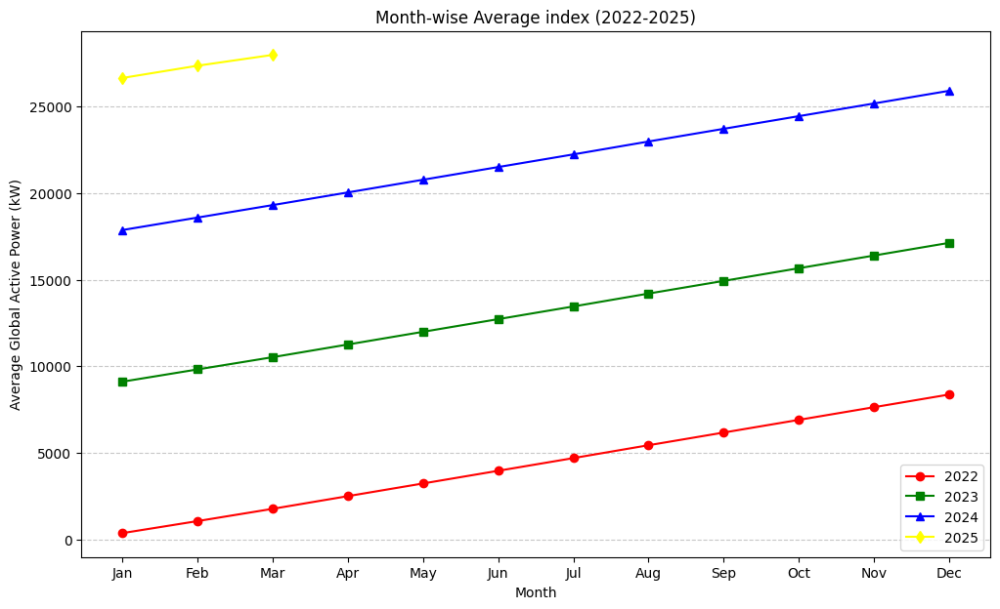

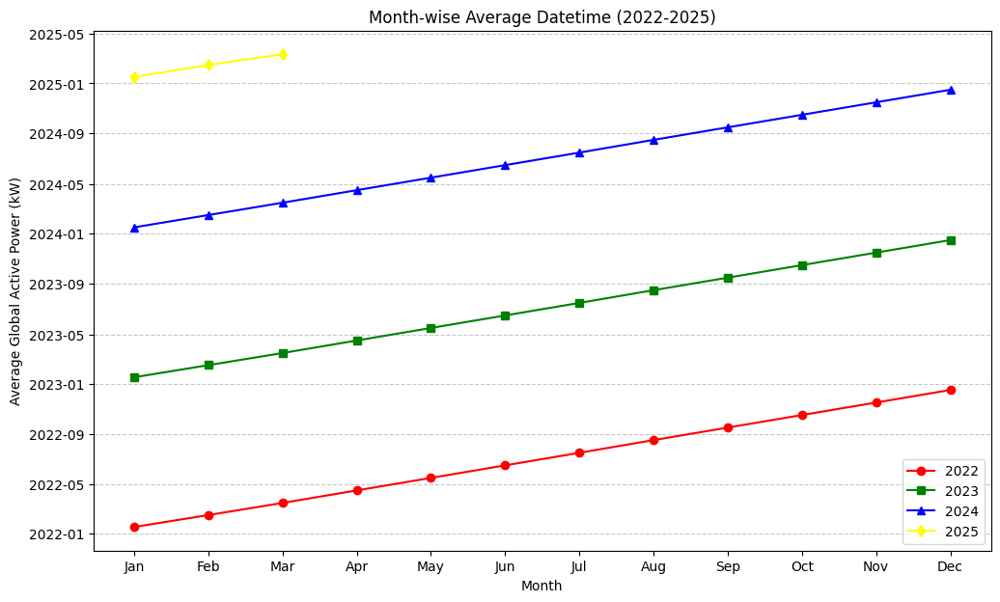

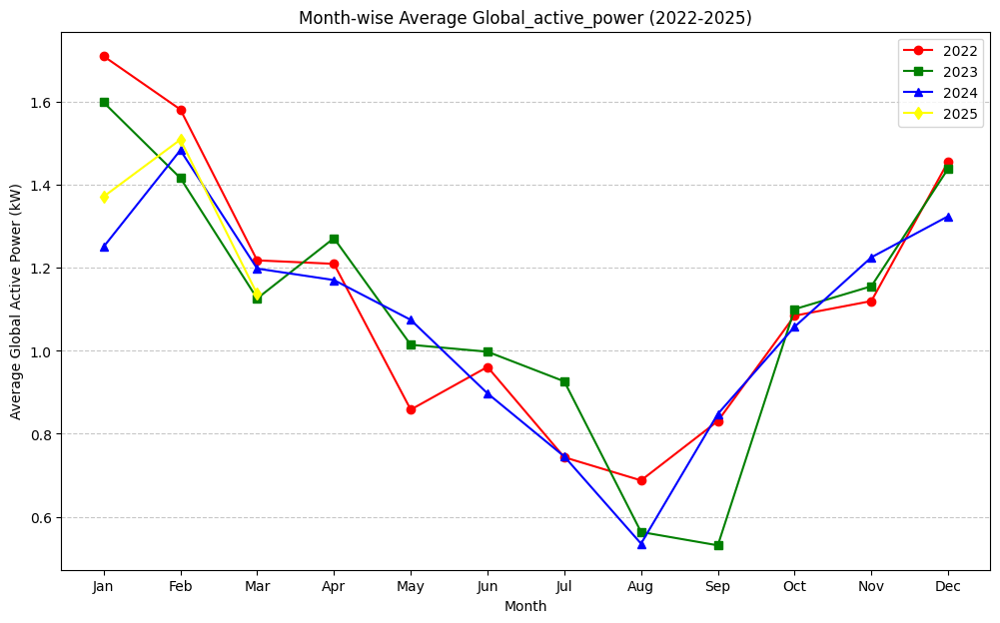

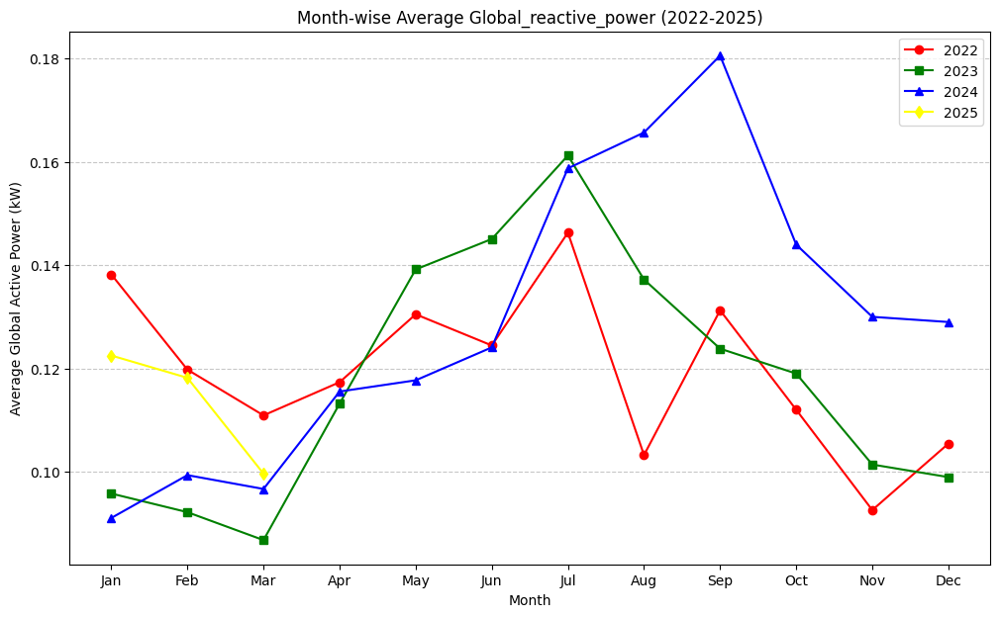

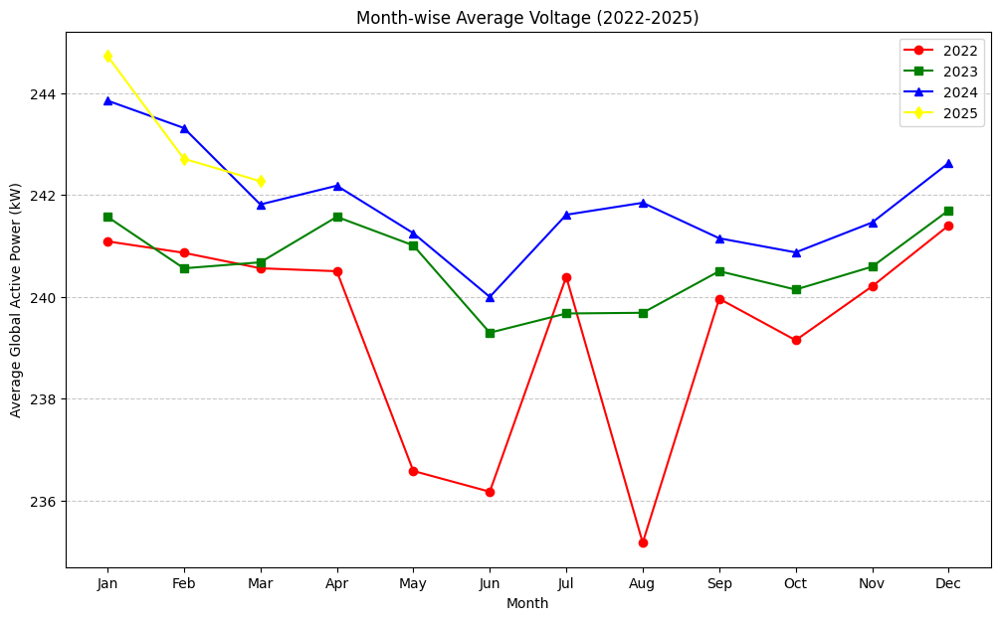

...

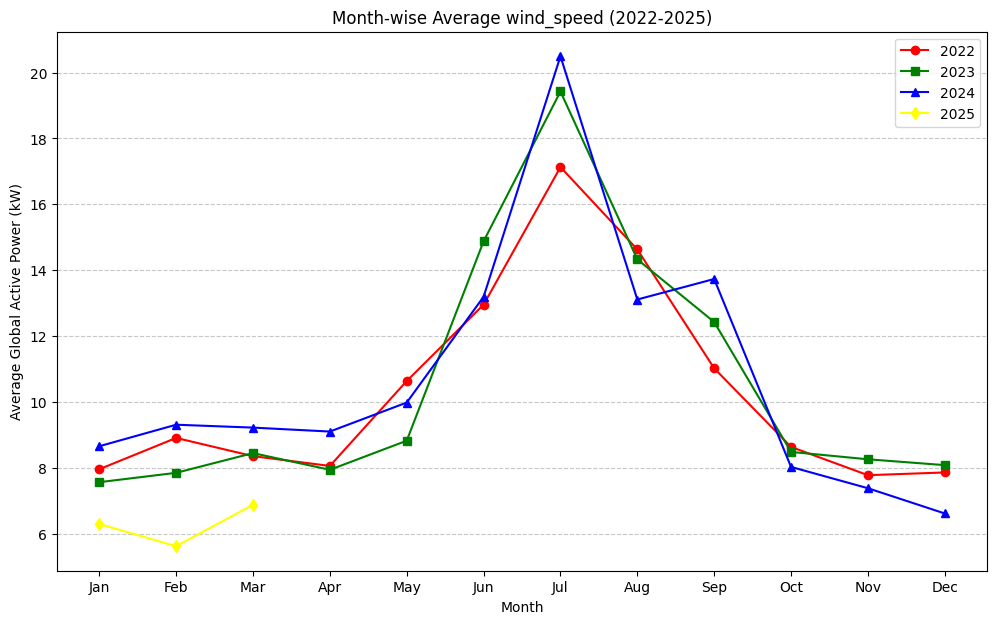

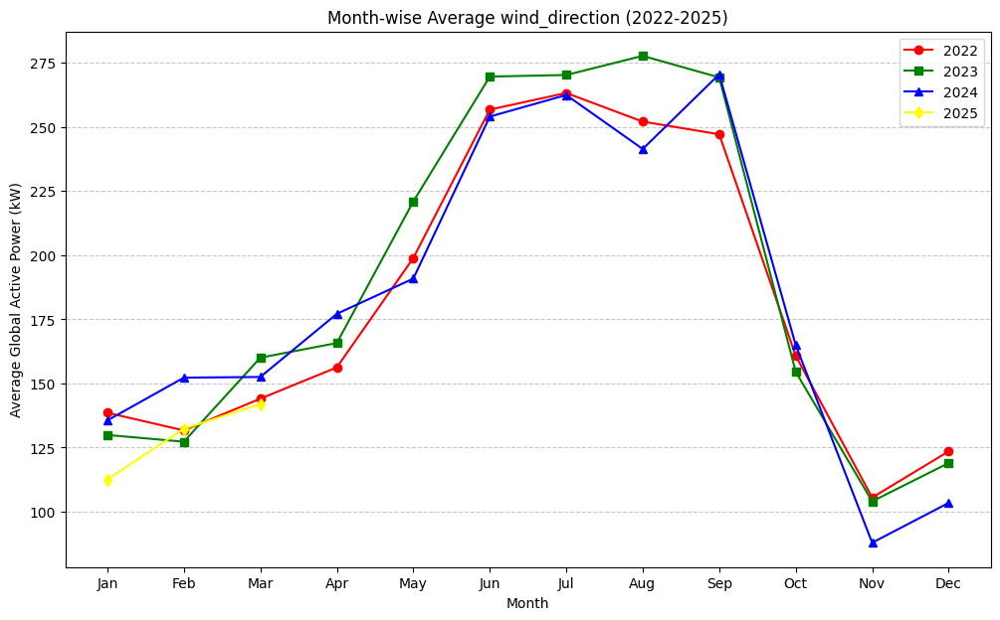

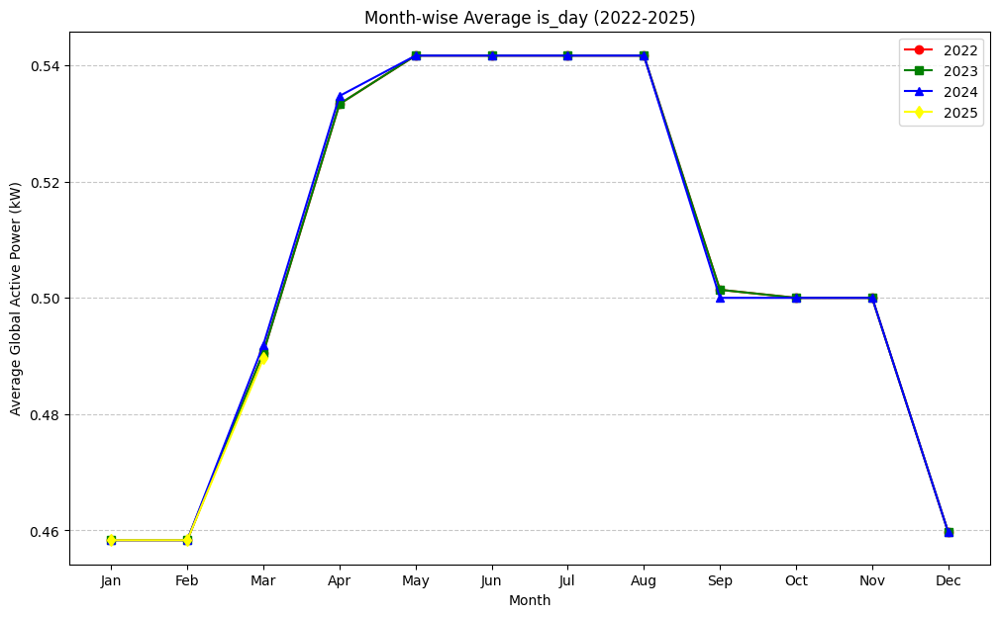

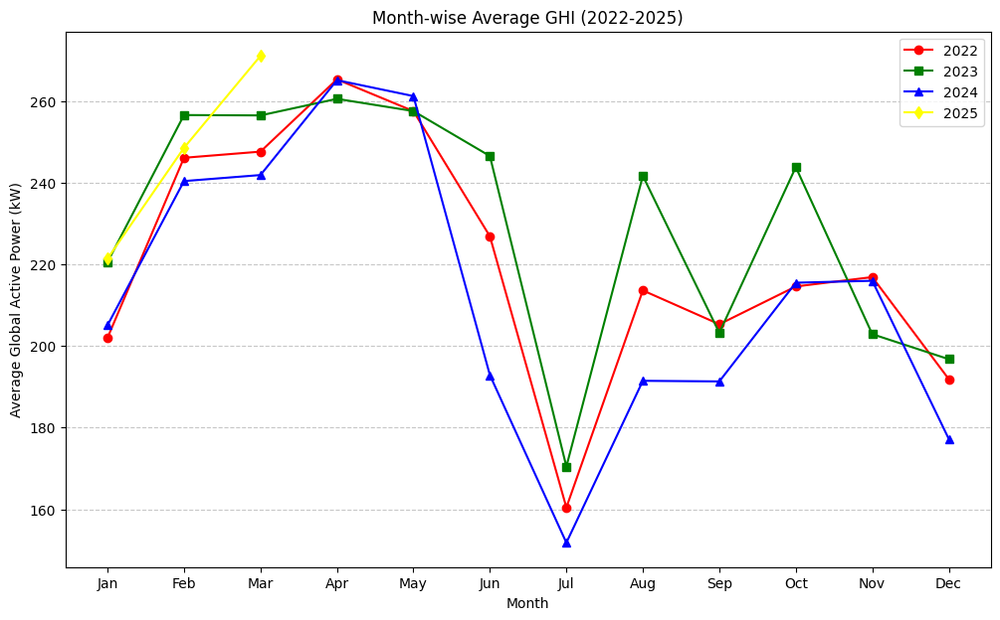

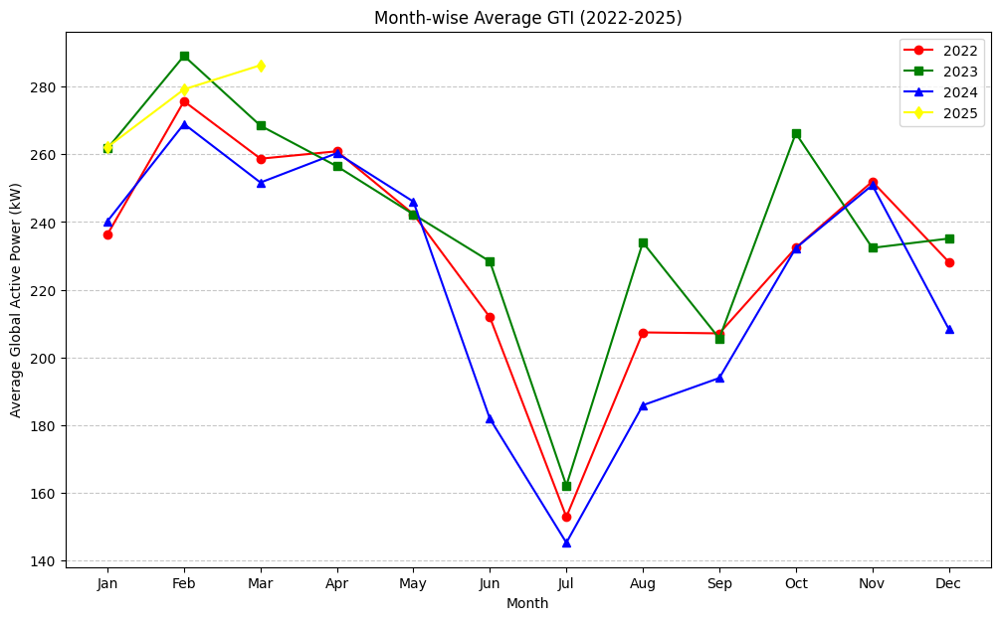

In [ ]:
# Convert 'Datetime' to datetime format
data_power['Datetime'] = pd.to_datetime(data_power['Datetime'])

# Filter data for the year 2022 - 2025
data_2022 = data_power[data_power['Datetime'].dt.year == 2022]
data_2023 = data_power[data_power['Datetime'].dt.year == 2023]
data_2024 = data_power[data_power['Datetime'].dt.year == 2024]
data_2025 = data_power[data_power['Datetime'].dt.year == 2025]

# Group by month and calculate average Global_active_power
for col in data_power.columns:
    monthly_avg_power_2022 = data_2022.groupby(data_2022['Datetime'].dt.month)[col].mean()
    monthly_avg_power_2023 = data_2023.groupby(data_2023['Datetime'].dt.month)[col].mean()
    monthly_avg_power_2024 = data_2024.groupby(data_2024['Datetime'].dt.month)[col].mean()
    monthly_avg_power_2025 = data_2025.groupby(data_2025['Datetime'].dt.month)[col].mean()

    # Plot the monthly average Global_active_power as a line plot
    plt.figure(figsize=(12, 7))
    plt.plot(monthly_avg_power_2022.index, monthly_avg_power_2022.values, marker='o', linestyle='-', color='red', label='2022')
    plt.plot(monthly_avg_power_2023.index, monthly_avg_power_2023.values, marker='s', linestyle='-', color='green', label='2023')
    plt.plot(monthly_avg_power_2024.index, monthly_avg_power_2024.values, marker='^', linestyle='-', color='blue', label='2024')
    plt.plot(monthly_avg_power_2025.index, monthly_avg_power_2025.values, marker='d', linestyle='-', color='yellow', label='2025')

    # Add plot details
    plt.title(f'Month-wise Average {col} (2022-2025)')
    plt.xlabel('Month')
    plt.ylabel('Average Global Active Power (kW)')
    plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
                                        'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.legend()
    plt.show()

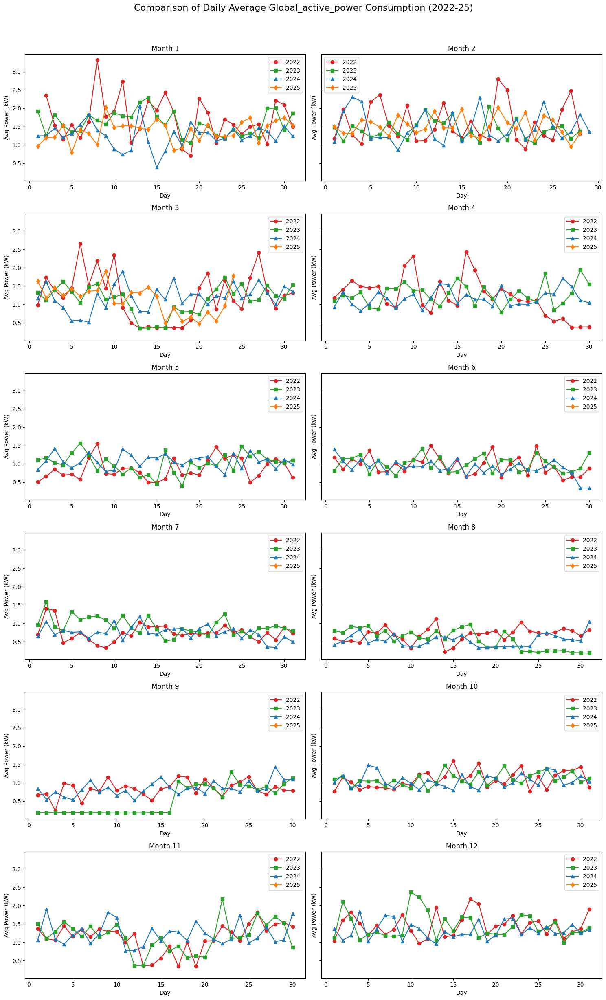

In [ ]:
data=pd.DataFrame(data_power)

# Convert Datetime to datetime format
data['Datetime'] = pd.to_datetime(data['Datetime'])

data['Year'] = data['Datetime'].dt.year
data['Month'] = data['Datetime'].dt.month
data['Day'] = data['Datetime'].dt.day
col='Global_active_power'

# Group by year, month, and day to get daily average power consumption
daily_avg_power = data.groupby(['Year', 'Month', 'Day'])[col].mean().reset_index()

# Split data into two years
year1 = daily_avg_power['Year'].unique()[0]
year2 = daily_avg_power['Year'].unique()[1]
year3 = daily_avg_power['Year'].unique()[2]
year4 = daily_avg_power['Year'].unique()[3]

data_year1 = daily_avg_power[daily_avg_power['Year'] == year1]
data_year2 = daily_avg_power[daily_avg_power['Year'] == year2]
data_year3 = daily_avg_power[daily_avg_power['Year'] == year3]
data_year4 = daily_avg_power[daily_avg_power['Year'] == year4]

# Create combined plot for both years in the same subplot for each month
fig, axes = plt.subplots(6, 2, figsize=(15, 25), sharey=True)
fig.suptitle(f'Comparison of Daily Average {col} Consumption (2022-25)', fontsize=16)

# Create 3-column grid plots for each year
for month in range(1, 13):
    ax = axes[(month - 1) // 2, (month - 1) % 2]
    month_data1 = data_year1[data_year1['Month'] == month]
    month_data2 = data_year2[data_year2['Month'] == month]
    month_data3 = data_year3[data_year3['Month'] == month]
    month_data4 = data_year4[data_year4['Month'] == month]
    ax.plot(month_data1['Day'], month_data1[col], marker='o', label=f'{year1}', color='tab:red')
    ax.plot(month_data2['Day'], month_data2[col], marker='s', label=f'{year2}', color='tab:green')
    ax.plot(month_data3['Day'], month_data3[col], marker='^', label=f'{year3}', color='tab:blue')
    ax.plot(month_data4['Day'], month_data4[col], marker='d', label=f'{year4}', color='tab:orange')

    ax.set_title(f'Month {month}')
    ax.set_xlabel('Day')
    ax.set_ylabel('Avg Power (kW)')
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

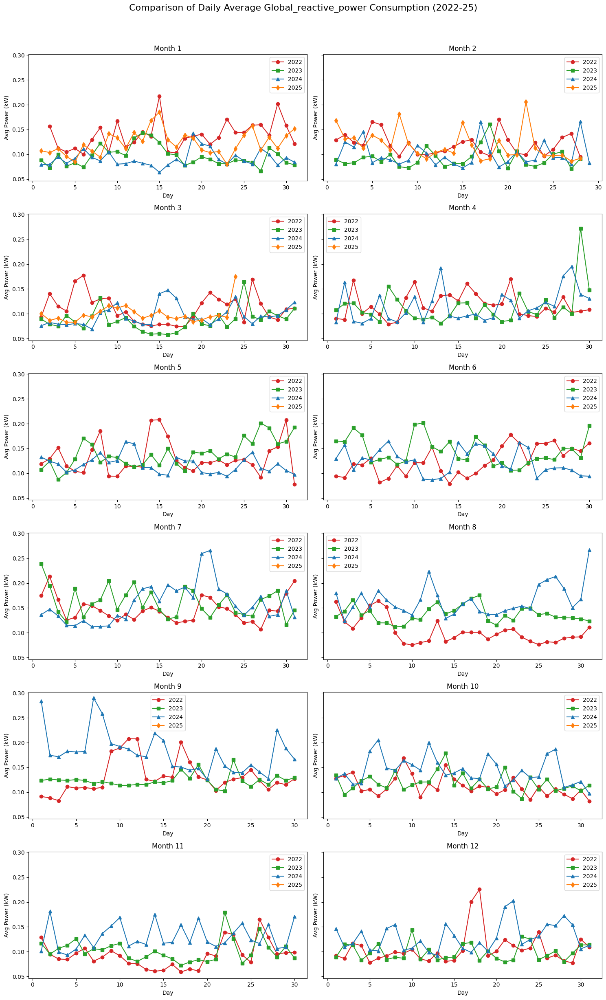

In [ ]:
data=pd.DataFrame(data_power)

# Convert Datetime to datetime format
data['Datetime'] = pd.to_datetime(data['Datetime'])

data['Year'] = data['Datetime'].dt.year
data['Month'] = data['Datetime'].dt.month
data['Day'] = data['Datetime'].dt.day
col='Global_reactive_power'

# Group by year, month, and day to get daily average power consumption
daily_avg_power = data.groupby(['Year', 'Month', 'Day'])[col].mean().reset_index()

# Split data into two years
year1 = daily_avg_power['Year'].unique()[0]
year2 = daily_avg_power['Year'].unique()[1]
year3 = daily_avg_power['Year'].unique()[2]
year4 = daily_avg_power['Year'].unique()[3]

data_year1 = daily_avg_power[daily_avg_power['Year'] == year1]
data_year2 = daily_avg_power[daily_avg_power['Year'] == year2]
data_year3 = daily_avg_power[daily_avg_power['Year'] == year3]
data_year4 = daily_avg_power[daily_avg_power['Year'] == year4]

# Create combined plot for both years in the same subplot for each month
fig, axes = plt.subplots(6, 2, figsize=(15, 25), sharey=True)
fig.suptitle(f'Comparison of Daily Average {col} Consumption (2022-25)', fontsize=16)

# Create 3-column grid plots for each year
for month in range(1, 13):
    ax = axes[(month - 1) // 2, (month - 1) % 2]
    month_data1 = data_year1[data_year1['Month'] == month]
    month_data2 = data_year2[data_year2['Month'] == month]
    month_data3 = data_year3[data_year3['Month'] == month]
    month_data4 = data_year4[data_year4['Month'] == month]
    ax.plot(month_data1['Day'], month_data1[col], marker='o', label=f'{year1}', color='tab:red')
    ax.plot(month_data2['Day'], month_data2[col], marker='s', label=f'{year2}', color='tab:green')
    ax.plot(month_data3['Day'], month_data3[col], marker='^', label=f'{year3}', color='tab:blue')
    ax.plot(month_data4['Day'], month_data4[col], marker='d', label=f'{year4}', color='tab:orange')

    ax.set_title(f'Month {month}')
    ax.set_xlabel('Day')
    ax.set_ylabel('Avg Power (kW)')
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

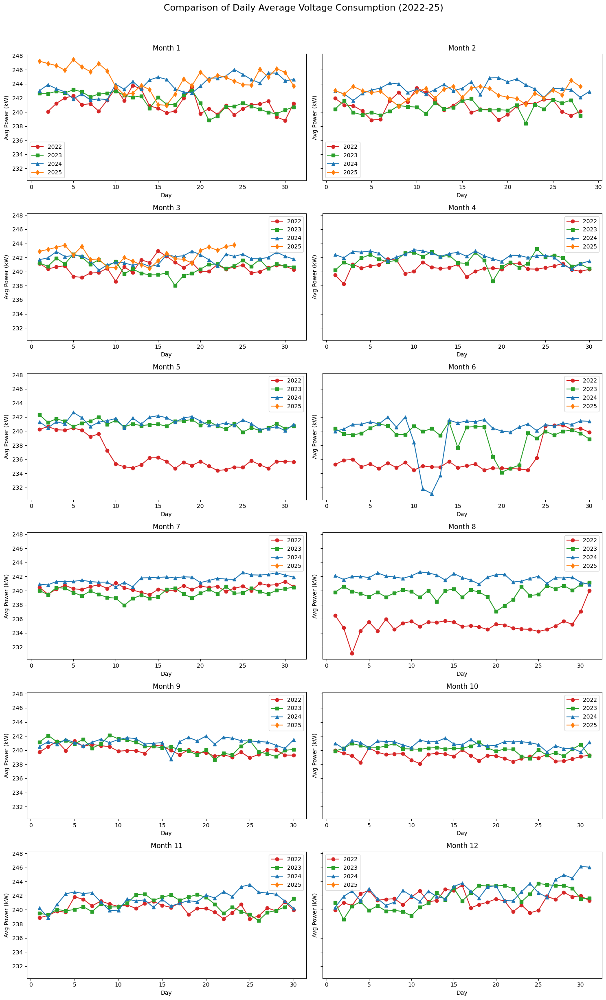

In [ ]:
data=pd.DataFrame(data_power)

# Convert Datetime to datetime format
data['Datetime'] = pd.to_datetime(data['Datetime'])

data['Year'] = data['Datetime'].dt.year
data['Month'] = data['Datetime'].dt.month
data['Day'] = data['Datetime'].dt.day
col='Voltage'

# Group by year, month, and day to get daily average power consumption
daily_avg_power = data.groupby(['Year', 'Month', 'Day'])[col].mean().reset_index()

# Split data into two years
year1 = daily_avg_power['Year'].unique()[0]
year2 = daily_avg_power['Year'].unique()[1]
year3 = daily_avg_power['Year'].unique()[2]
year4 = daily_avg_power['Year'].unique()[3]

data_year1 = daily_avg_power[daily_avg_power['Year'] == year1]
data_year2 = daily_avg_power[daily_avg_power['Year'] == year2]
data_year3 = daily_avg_power[daily_avg_power['Year'] == year3]
data_year4 = daily_avg_power[daily_avg_power['Year'] == year4]

# Create combined plot for both years in the same subplot for each month
fig, axes = plt.subplots(6, 2, figsize=(15, 25), sharey=True)
fig.suptitle(f'Comparison of Daily Average {col} Consumption (2022-25)', fontsize=16)

# Create 3-column grid plots for each year
for month in range(1, 13):
    ax = axes[(month - 1) // 2, (month - 1) % 2]
    month_data1 = data_year1[data_year1['Month'] == month]
    month_data2 = data_year2[data_year2['Month'] == month]
    month_data3 = data_year3[data_year3['Month'] == month]
    month_data4 = data_year4[data_year4['Month'] == month]
    ax.plot(month_data1['Day'], month_data1[col], marker='o', label=f'{year1}', color='tab:red')
    ax.plot(month_data2['Day'], month_data2[col], marker='s', label=f'{year2}', color='tab:green')
    ax.plot(month_data3['Day'], month_data3[col], marker='^', label=f'{year3}', color='tab:blue')
    ax.plot(month_data4['Day'], month_data4[col], marker='d', label=f'{year4}', color='tab:orange')

    ax.set_title(f'Month {month}')
    ax.set_xlabel('Day')
    ax.set_ylabel('Avg Power (kW)')
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

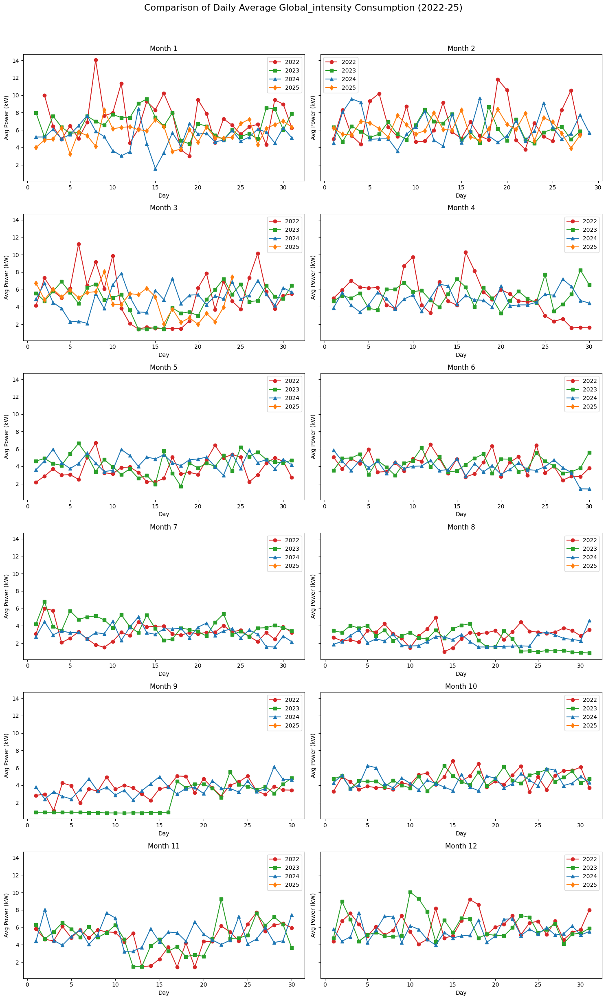

In [ ]:
data=pd.DataFrame(data_power)

# Convert Datetime to datetime format
data['Datetime'] = pd.to_datetime(data['Datetime'])

data['Year'] = data['Datetime'].dt.year
data['Month'] = data['Datetime'].dt.month
data['Day'] = data['Datetime'].dt.day
col='Global_intensity'

# Group by year, month, and day to get daily average power consumption
daily_avg_power = data.groupby(['Year', 'Month', 'Day'])[col].mean().reset_index()

# Split data into two years
year1 = daily_avg_power['Year'].unique()[0]
year2 = daily_avg_power['Year'].unique()[1]
year3 = daily_avg_power['Year'].unique()[2]
year4 = daily_avg_power['Year'].unique()[3]

data_year1 = daily_avg_power[daily_avg_power['Year'] == year1]
data_year2 = daily_avg_power[daily_avg_power['Year'] == year2]
data_year3 = daily_avg_power[daily_avg_power['Year'] == year3]
data_year4 = daily_avg_power[daily_avg_power['Year'] == year4]

# Create combined plot for both years in the same subplot for each month
fig, axes = plt.subplots(6, 2, figsize=(15, 25), sharey=True)
fig.suptitle(f'Comparison of Daily Average {col} Consumption (2022-25)', fontsize=16)

# Create 3-column grid plots for each year
for month in range(1, 13):
    ax = axes[(month - 1) // 2, (month - 1) % 2]
    month_data1 = data_year1[data_year1['Month'] == month]
    month_data2 = data_year2[data_year2['Month'] == month]
    month_data3 = data_year3[data_year3['Month'] == month]
    month_data4 = data_year4[data_year4['Month'] == month]
    ax.plot(month_data1['Day'], month_data1[col], marker='o', label=f'{year1}', color='tab:red')
    ax.plot(month_data2['Day'], month_data2[col], marker='s', label=f'{year2}', color='tab:green')
    ax.plot(month_data3['Day'], month_data3[col], marker='^', label=f'{year3}', color='tab:blue')
    ax.plot(month_data4['Day'], month_data4[col], marker='d', label=f'{year4}', color='tab:orange')

    ax.set_title(f'Month {month}')
    ax.set_xlabel('Day')
    ax.set_ylabel('Avg Power (kW)')
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

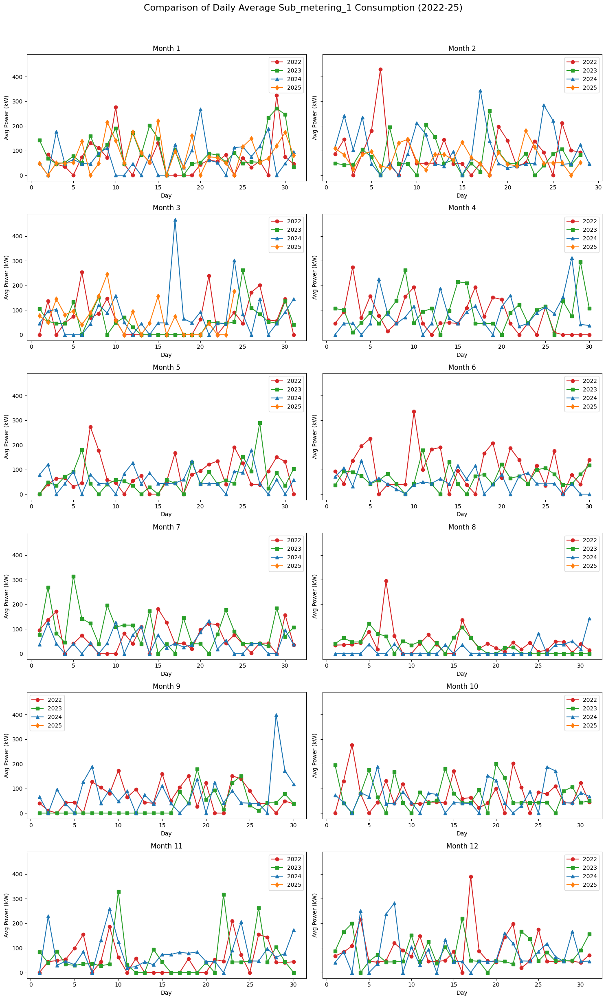

In [ ]:
data=pd.DataFrame(data_power)

# Convert Datetime to datetime format
data['Datetime'] = pd.to_datetime(data['Datetime'])

data['Year'] = data['Datetime'].dt.year
data['Month'] = data['Datetime'].dt.month
data['Day'] = data['Datetime'].dt.day
col='Sub_metering_1'

# Group by year, month, and day to get daily average power consumption
daily_avg_power = data.groupby(['Year', 'Month', 'Day'])[col].mean().reset_index()

# Split data into two years
year1 = daily_avg_power['Year'].unique()[0]
year2 = daily_avg_power['Year'].unique()[1]
year3 = daily_avg_power['Year'].unique()[2]
year4 = daily_avg_power['Year'].unique()[3]

data_year1 = daily_avg_power[daily_avg_power['Year'] == year1]
data_year2 = daily_avg_power[daily_avg_power['Year'] == year2]
data_year3 = daily_avg_power[daily_avg_power['Year'] == year3]
data_year4 = daily_avg_power[daily_avg_power['Year'] == year4]

# Create combined plot for both years in the same subplot for each month
fig, axes = plt.subplots(6, 2, figsize=(15, 25), sharey=True)
fig.suptitle(f'Comparison of Daily Average {col} Consumption (2022-25)', fontsize=16)

# Create 3-column grid plots for each year
for month in range(1, 13):
    ax = axes[(month - 1) // 2, (month - 1) % 2]
    month_data1 = data_year1[data_year1['Month'] == month]
    month_data2 = data_year2[data_year2['Month'] == month]
    month_data3 = data_year3[data_year3['Month'] == month]
    month_data4 = data_year4[data_year4['Month'] == month]
    ax.plot(month_data1['Day'], month_data1[col], marker='o', label=f'{year1}', color='tab:red')
    ax.plot(month_data2['Day'], month_data2[col], marker='s', label=f'{year2}', color='tab:green')
    ax.plot(month_data3['Day'], month_data3[col], marker='^', label=f'{year3}', color='tab:blue')
    ax.plot(month_data4['Day'], month_data4[col], marker='d', label=f'{year4}', color='tab:orange')

    ax.set_title(f'Month {month}')
    ax.set_xlabel('Day')
    ax.set_ylabel('Avg Power (kW)')
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

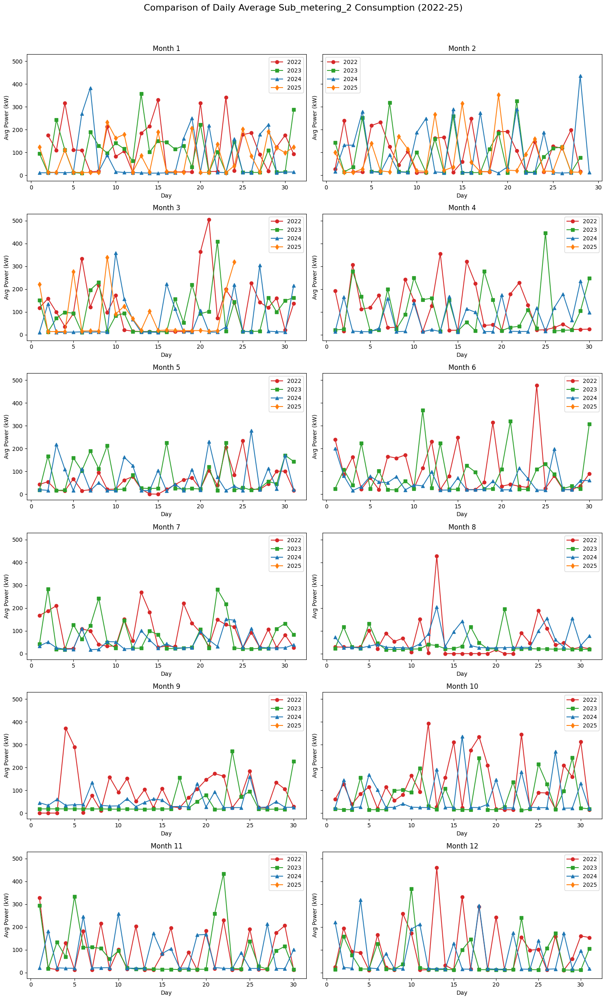

In [ ]:
data=pd.DataFrame(data_power)

# Convert Datetime to datetime format
data['Datetime'] = pd.to_datetime(data['Datetime'])

data['Year'] = data['Datetime'].dt.year
data['Month'] = data['Datetime'].dt.month
data['Day'] = data['Datetime'].dt.day
col='Sub_metering_2'

# Group by year, month, and day to get daily average power consumption
daily_avg_power = data.groupby(['Year', 'Month', 'Day'])[col].mean().reset_index()

# Split data into two years
year1 = daily_avg_power['Year'].unique()[0]
year2 = daily_avg_power['Year'].unique()[1]
year3 = daily_avg_power['Year'].unique()[2]
year4 = daily_avg_power['Year'].unique()[3]

data_year1 = daily_avg_power[daily_avg_power['Year'] == year1]
data_year2 = daily_avg_power[daily_avg_power['Year'] == year2]
data_year3 = daily_avg_power[daily_avg_power['Year'] == year3]
data_year4 = daily_avg_power[daily_avg_power['Year'] == year4]

# Create combined plot for both years in the same subplot for each month
fig, axes = plt.subplots(6, 2, figsize=(15, 25), sharey=True)
fig.suptitle(f'Comparison of Daily Average {col} Consumption (2022-25)', fontsize=16)

# Create 3-column grid plots for each year
for month in range(1, 13):
    ax = axes[(month - 1) // 2, (month - 1) % 2]
    month_data1 = data_year1[data_year1['Month'] == month]
    month_data2 = data_year2[data_year2['Month'] == month]
    month_data3 = data_year3[data_year3['Month'] == month]
    month_data4 = data_year4[data_year4['Month'] == month]
    ax.plot(month_data1['Day'], month_data1[col], marker='o', label=f'{year1}', color='tab:red')
    ax.plot(month_data2['Day'], month_data2[col], marker='s', label=f'{year2}', color='tab:green')
    ax.plot(month_data3['Day'], month_data3[col], marker='^', label=f'{year3}', color='tab:blue')
    ax.plot(month_data4['Day'], month_data4[col], marker='d', label=f'{year4}', color='tab:orange')

    ax.set_title(f'Month {month}')
    ax.set_xlabel('Day')
    ax.set_ylabel('Avg Power (kW)')
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

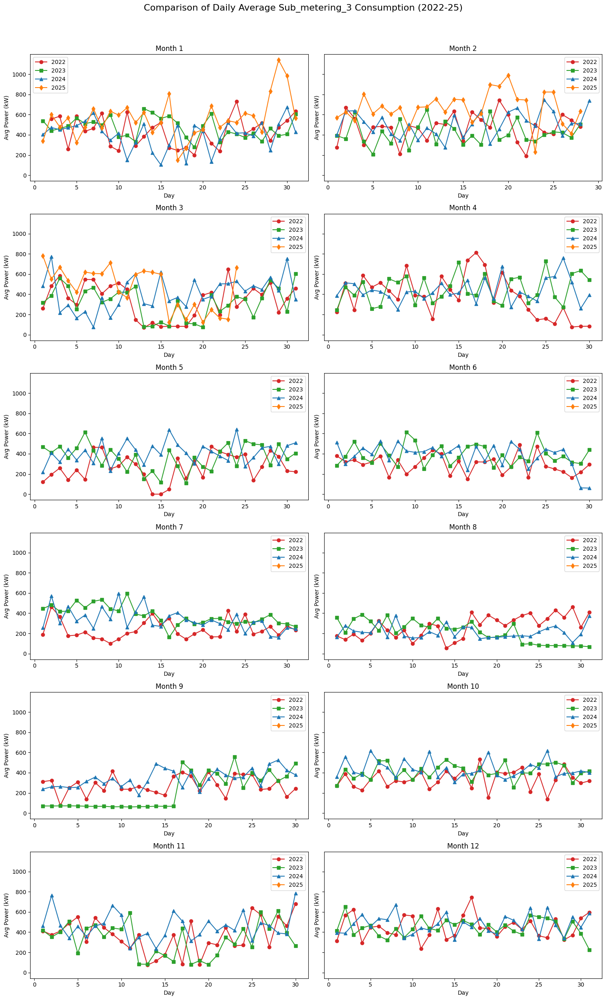

In [ ]:
data=pd.DataFrame(data_power)

# Convert Datetime to datetime format
data['Datetime'] = pd.to_datetime(data['Datetime'])

data['Year'] = data['Datetime'].dt.year
data['Month'] = data['Datetime'].dt.month
data['Day'] = data['Datetime'].dt.day
col='Sub_metering_3'

# Group by year, month, and day to get daily average power consumption
daily_avg_power = data.groupby(['Year', 'Month', 'Day'])[col].mean().reset_index()

# Split data into two years
year1 = daily_avg_power['Year'].unique()[0]
year2 = daily_avg_power['Year'].unique()[1]
year3 = daily_avg_power['Year'].unique()[2]
year4 = daily_avg_power['Year'].unique()[3]

data_year1 = daily_avg_power[daily_avg_power['Year'] == year1]
data_year2 = daily_avg_power[daily_avg_power['Year'] == year2]
data_year3 = daily_avg_power[daily_avg_power['Year'] == year3]
data_year4 = daily_avg_power[daily_avg_power['Year'] == year4]

# Create combined plot for both years in the same subplot for each month
fig, axes = plt.subplots(6, 2, figsize=(15, 25), sharey=True)
fig.suptitle(f'Comparison of Daily Average {col} Consumption (2022-25)', fontsize=16)

# Create 3-column grid plots for each year
for month in range(1, 13):
    ax = axes[(month - 1) // 2, (month - 1) % 2]
    month_data1 = data_year1[data_year1['Month'] == month]
    month_data2 = data_year2[data_year2['Month'] == month]
    month_data3 = data_year3[data_year3['Month'] == month]
    month_data4 = data_year4[data_year4['Month'] == month]
    ax.plot(month_data1['Day'], month_data1[col], marker='o', label=f'{year1}', color='tab:red')
    ax.plot(month_data2['Day'], month_data2[col], marker='s', label=f'{year2}', color='tab:green')
    ax.plot(month_data3['Day'], month_data3[col], marker='^', label=f'{year3}', color='tab:blue')
    ax.plot(month_data4['Day'], month_data4[col], marker='d', label=f'{year4}', color='tab:orange')

    ax.set_title(f'Month {month}')
    ax.set_xlabel('Day')
    ax.set_ylabel('Avg Power (kW)')
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

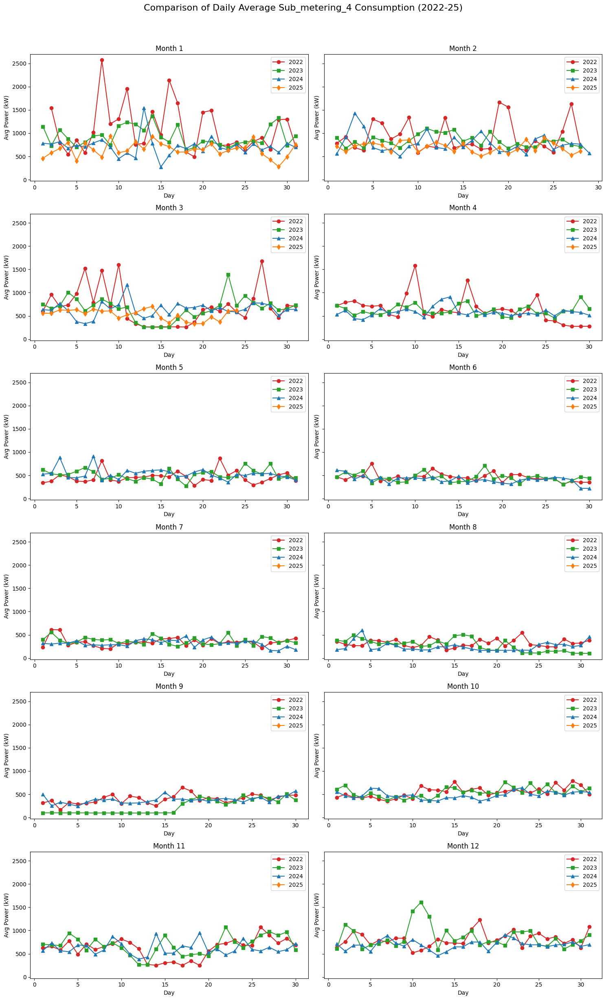

In [ ]:
data=pd.DataFrame(data_power)

# Convert Datetime to datetime format
data['Datetime'] = pd.to_datetime(data['Datetime'])

data['Year'] = data['Datetime'].dt.year
data['Month'] = data['Datetime'].dt.month
data['Day'] = data['Datetime'].dt.day
col='Sub_metering_4'

# Group by year, month, and day to get daily average power consumption
daily_avg_power = data.groupby(['Year', 'Month', 'Day'])[col].mean().reset_index()

# Split data into two years
year1 = daily_avg_power['Year'].unique()[0]
year2 = daily_avg_power['Year'].unique()[1]
year3 = daily_avg_power['Year'].unique()[2]
year4 = daily_avg_power['Year'].unique()[3]

data_year1 = daily_avg_power[daily_avg_power['Year'] == year1]
data_year2 = daily_avg_power[daily_avg_power['Year'] == year2]
data_year3 = daily_avg_power[daily_avg_power['Year'] == year3]
data_year4 = daily_avg_power[daily_avg_power['Year'] == year4]

# Create combined plot for both years in the same subplot for each month
fig, axes = plt.subplots(6, 2, figsize=(15, 25), sharey=True)
fig.suptitle(f'Comparison of Daily Average {col} Consumption (2022-25)', fontsize=16)

# Create 3-column grid plots for each year
for month in range(1, 13):
    ax = axes[(month - 1) // 2, (month - 1) % 2]
    month_data1 = data_year1[data_year1['Month'] == month]
    month_data2 = data_year2[data_year2['Month'] == month]
    month_data3 = data_year3[data_year3['Month'] == month]
    month_data4 = data_year4[data_year4['Month'] == month]
    ax.plot(month_data1['Day'], month_data1[col], marker='o', label=f'{year1}', color='tab:red')
    ax.plot(month_data2['Day'], month_data2[col], marker='s', label=f'{year2}', color='tab:green')
    ax.plot(month_data3['Day'], month_data3[col], marker='^', label=f'{year3}', color='tab:blue')
    ax.plot(month_data4['Day'], month_data4[col], marker='d', label=f'{year4}', color='tab:orange')

    ax.set_title(f'Month {month}')
    ax.set_xlabel('Day')
    ax.set_ylabel('Avg Power (kW)')
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

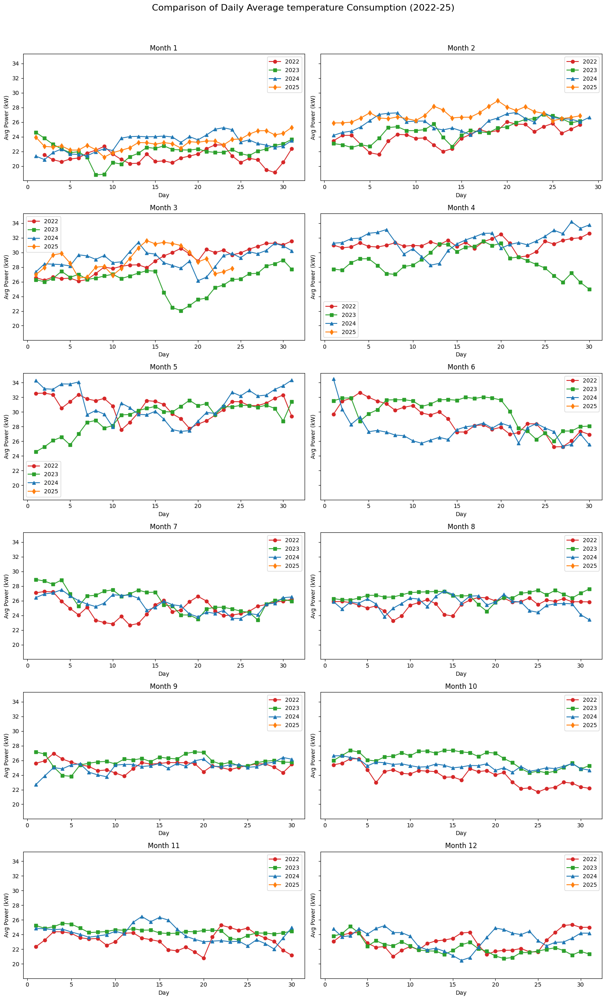

In [ ]:
data=pd.DataFrame(data_power)

# Convert Datetime to datetime format
data['Datetime'] = pd.to_datetime(data['Datetime'])

data['Year'] = data['Datetime'].dt.year
data['Month'] = data['Datetime'].dt.month
data['Day'] = data['Datetime'].dt.day
col='temperature'

# Group by year, month, and day to get daily average power consumption
daily_avg_power = data.groupby(['Year', 'Month', 'Day'])[col].mean().reset_index()

# Split data into two years
year1 = daily_avg_power['Year'].unique()[0]
year2 = daily_avg_power['Year'].unique()[1]
year3 = daily_avg_power['Year'].unique()[2]
year4 = daily_avg_power['Year'].unique()[3]

data_year1 = daily_avg_power[daily_avg_power['Year'] == year1]
data_year2 = daily_avg_power[daily_avg_power['Year'] == year2]
data_year3 = daily_avg_power[daily_avg_power['Year'] == year3]
data_year4 = daily_avg_power[daily_avg_power['Year'] == year4]

# Create combined plot for both years in the same subplot for each month
fig, axes = plt.subplots(6, 2, figsize=(15, 25), sharey=True)
fig.suptitle(f'Comparison of Daily Average {col} Consumption (2022-25)', fontsize=16)

# Create 3-column grid plots for each year
for month in range(1, 13):
    ax = axes[(month - 1) // 2, (month - 1) % 2]
    month_data1 = data_year1[data_year1['Month'] == month]
    month_data2 = data_year2[data_year2['Month'] == month]
    month_data3 = data_year3[data_year3['Month'] == month]
    month_data4 = data_year4[data_year4['Month'] == month]
    ax.plot(month_data1['Day'], month_data1[col], marker='o', label=f'{year1}', color='tab:red')
    ax.plot(month_data2['Day'], month_data2[col], marker='s', label=f'{year2}', color='tab:green')
    ax.plot(month_data3['Day'], month_data3[col], marker='^', label=f'{year3}', color='tab:blue')
    ax.plot(month_data4['Day'], month_data4[col], marker='d', label=f'{year4}', color='tab:orange')

    ax.set_title(f'Month {month}')
    ax.set_xlabel('Day')
    ax.set_ylabel('Avg Power (kW)')
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

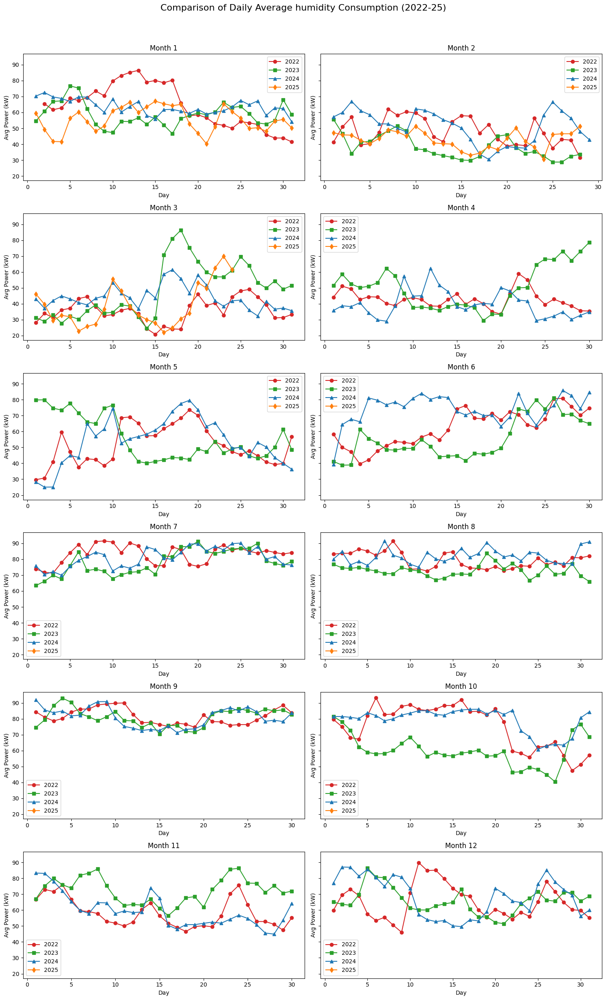

In [ ]:
data=pd.DataFrame(data_power)

# Convert Datetime to datetime format
data['Datetime'] = pd.to_datetime(data['Datetime'])

data['Year'] = data['Datetime'].dt.year
data['Month'] = data['Datetime'].dt.month
data['Day'] = data['Datetime'].dt.day
col='humidity'

# Group by year, month, and day to get daily average power consumption
daily_avg_power = data.groupby(['Year', 'Month', 'Day'])[col].mean().reset_index()

# Split data into two years
year1 = daily_avg_power['Year'].unique()[0]
year2 = daily_avg_power['Year'].unique()[1]
year3 = daily_avg_power['Year'].unique()[2]
year4 = daily_avg_power['Year'].unique()[3]

data_year1 = daily_avg_power[daily_avg_power['Year'] == year1]
data_year2 = daily_avg_power[daily_avg_power['Year'] == year2]
data_year3 = daily_avg_power[daily_avg_power['Year'] == year3]
data_year4 = daily_avg_power[daily_avg_power['Year'] == year4]

# Create combined plot for both years in the same subplot for each month
fig, axes = plt.subplots(6, 2, figsize=(15, 25), sharey=True)
fig.suptitle(f'Comparison of Daily Average {col} Consumption (2022-25)', fontsize=16)

# Create 3-column grid plots for each year
for month in range(1, 13):
    ax = axes[(month - 1) // 2, (month - 1) % 2]
    month_data1 = data_year1[data_year1['Month'] == month]
    month_data2 = data_year2[data_year2['Month'] == month]
    month_data3 = data_year3[data_year3['Month'] == month]
    month_data4 = data_year4[data_year4['Month'] == month]
    ax.plot(month_data1['Day'], month_data1[col], marker='o', label=f'{year1}', color='tab:red')
    ax.plot(month_data2['Day'], month_data2[col], marker='s', label=f'{year2}', color='tab:green')
    ax.plot(month_data3['Day'], month_data3[col], marker='^', label=f'{year3}', color='tab:blue')
    ax.plot(month_data4['Day'], month_data4[col], marker='d', label=f'{year4}', color='tab:orange')

    ax.set_title(f'Month {month}')
    ax.set_xlabel('Day')
    ax.set_ylabel('Avg Power (kW)')
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

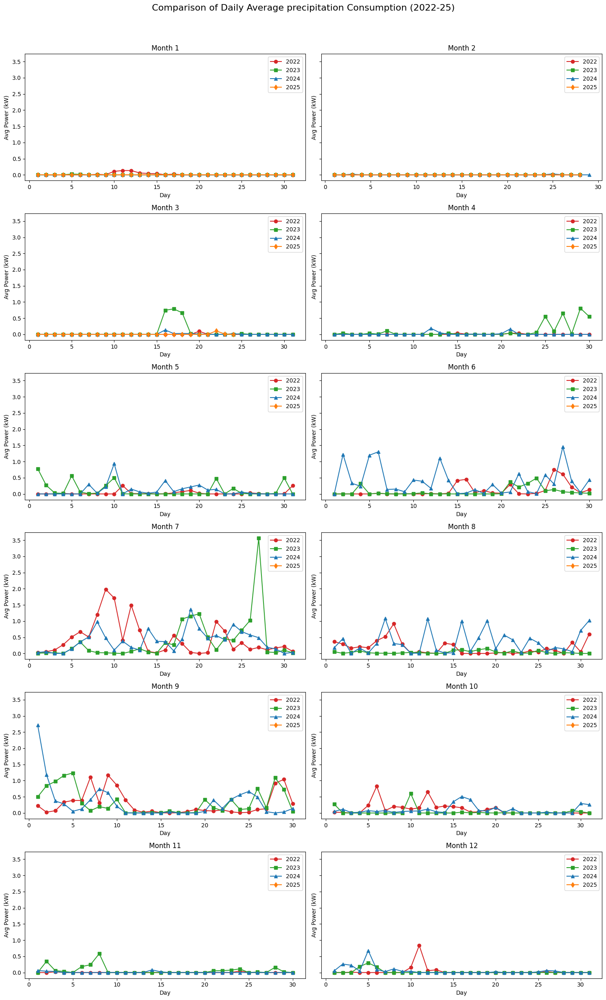

In [ ]:
data=pd.DataFrame(data_power)

# Convert Datetime to datetime format
data['Datetime'] = pd.to_datetime(data['Datetime'])

data['Year'] = data['Datetime'].dt.year
data['Month'] = data['Datetime'].dt.month
data['Day'] = data['Datetime'].dt.day
col='precipitation'

# Group by year, month, and day to get daily average power consumption
daily_avg_power = data.groupby(['Year', 'Month', 'Day'])[col].mean().reset_index()

# Split data into two years
year1 = daily_avg_power['Year'].unique()[0]
year2 = daily_avg_power['Year'].unique()[1]
year3 = daily_avg_power['Year'].unique()[2]
year4 = daily_avg_power['Year'].unique()[3]

data_year1 = daily_avg_power[daily_avg_power['Year'] == year1]
data_year2 = daily_avg_power[daily_avg_power['Year'] == year2]
data_year3 = daily_avg_power[daily_avg_power['Year'] == year3]
data_year4 = daily_avg_power[daily_avg_power['Year'] == year4]

# Create combined plot for both years in the same subplot for each month
fig, axes = plt.subplots(6, 2, figsize=(15, 25), sharey=True)
fig.suptitle(f'Comparison of Daily Average {col} Consumption (2022-25)', fontsize=16)

# Create 3-column grid plots for each year
for month in range(1, 13):
    ax = axes[(month - 1) // 2, (month - 1) % 2]
    month_data1 = data_year1[data_year1['Month'] == month]
    month_data2 = data_year2[data_year2['Month'] == month]
    month_data3 = data_year3[data_year3['Month'] == month]
    month_data4 = data_year4[data_year4['Month'] == month]
    ax.plot(month_data1['Day'], month_data1[col], marker='o', label=f'{year1}', color='tab:red')
    ax.plot(month_data2['Day'], month_data2[col], marker='s', label=f'{year2}', color='tab:green')
    ax.plot(month_data3['Day'], month_data3[col], marker='^', label=f'{year3}', color='tab:blue')
    ax.plot(month_data4['Day'], month_data4[col], marker='d', label=f'{year4}', color='tab:orange')

    ax.set_title(f'Month {month}')
    ax.set_xlabel('Day')
    ax.set_ylabel('Avg Power (kW)')
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

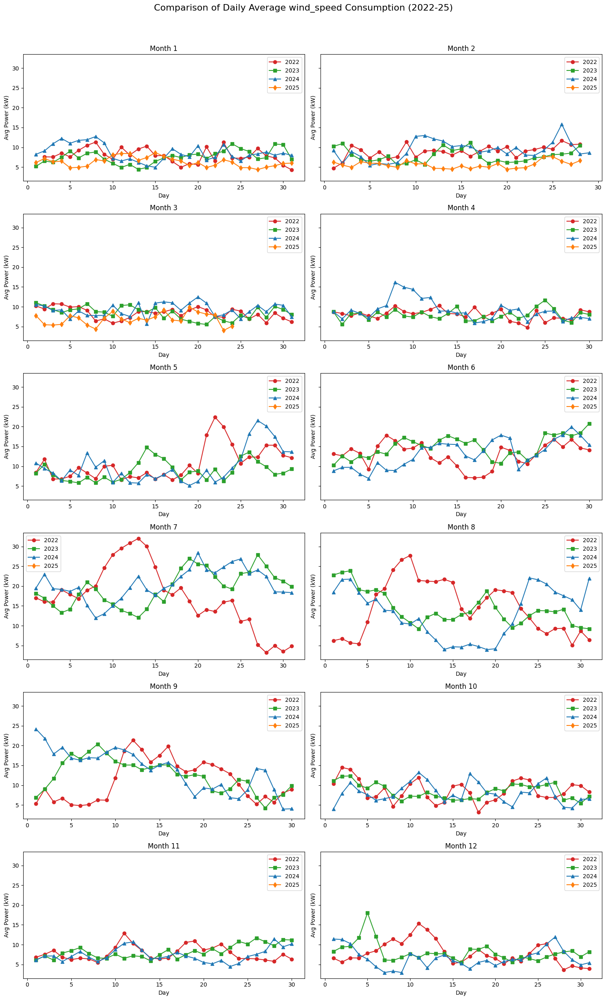

In [ ]:
data=pd.DataFrame(data_power)

# Convert Datetime to datetime format
data['Datetime'] = pd.to_datetime(data['Datetime'])

data['Year'] = data['Datetime'].dt.year
data['Month'] = data['Datetime'].dt.month
data['Day'] = data['Datetime'].dt.day
col='wind_speed'

# Group by year, month, and day to get daily average power consumption
daily_avg_power = data.groupby(['Year', 'Month', 'Day'])[col].mean().reset_index()

# Split data into two years
year1 = daily_avg_power['Year'].unique()[0]
year2 = daily_avg_power['Year'].unique()[1]
year3 = daily_avg_power['Year'].unique()[2]
year4 = daily_avg_power['Year'].unique()[3]

data_year1 = daily_avg_power[daily_avg_power['Year'] == year1]
data_year2 = daily_avg_power[daily_avg_power['Year'] == year2]
data_year3 = daily_avg_power[daily_avg_power['Year'] == year3]
data_year4 = daily_avg_power[daily_avg_power['Year'] == year4]

# Create combined plot for both years in the same subplot for each month
fig, axes = plt.subplots(6, 2, figsize=(15, 25), sharey=True)
fig.suptitle(f'Comparison of Daily Average {col} Consumption (2022-25)', fontsize=16)

# Create 3-column grid plots for each year
for month in range(1, 13):
    ax = axes[(month - 1) // 2, (month - 1) % 2]
    month_data1 = data_year1[data_year1['Month'] == month]
    month_data2 = data_year2[data_year2['Month'] == month]
    month_data3 = data_year3[data_year3['Month'] == month]
    month_data4 = data_year4[data_year4['Month'] == month]
    ax.plot(month_data1['Day'], month_data1[col], marker='o', label=f'{year1}', color='tab:red')
    ax.plot(month_data2['Day'], month_data2[col], marker='s', label=f'{year2}', color='tab:green')
    ax.plot(month_data3['Day'], month_data3[col], marker='^', label=f'{year3}', color='tab:blue')
    ax.plot(month_data4['Day'], month_data4[col], marker='d', label=f'{year4}', color='tab:orange')

    ax.set_title(f'Month {month}')
    ax.set_xlabel('Day')
    ax.set_ylabel('Avg Power (kW)')
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

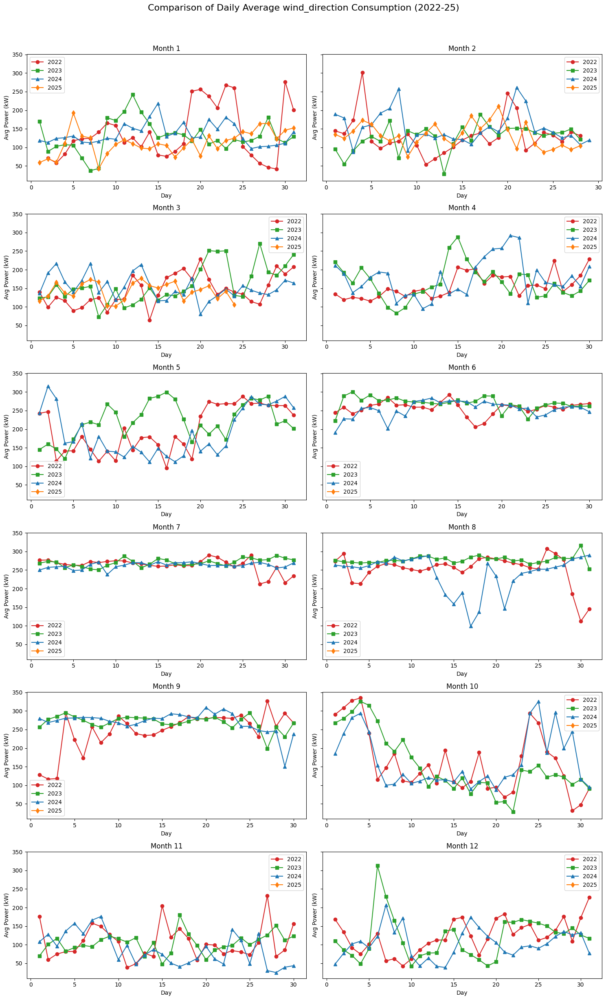

In [ ]:
data=pd.DataFrame(data_power)

# Convert Datetime to datetime format
data['Datetime'] = pd.to_datetime(data['Datetime'])

data['Year'] = data['Datetime'].dt.year
data['Month'] = data['Datetime'].dt.month
data['Day'] = data['Datetime'].dt.day
col='wind_direction'

# Group by year, month, and day to get daily average power consumption
daily_avg_power = data.groupby(['Year', 'Month', 'Day'])[col].mean().reset_index()

# Split data into two years
year1 = daily_avg_power['Year'].unique()[0]
year2 = daily_avg_power['Year'].unique()[1]
year3 = daily_avg_power['Year'].unique()[2]
year4 = daily_avg_power['Year'].unique()[3]

data_year1 = daily_avg_power[daily_avg_power['Year'] == year1]
data_year2 = daily_avg_power[daily_avg_power['Year'] == year2]
data_year3 = daily_avg_power[daily_avg_power['Year'] == year3]
data_year4 = daily_avg_power[daily_avg_power['Year'] == year4]

# Create combined plot for both years in the same subplot for each month
fig, axes = plt.subplots(6, 2, figsize=(15, 25), sharey=True)
fig.suptitle(f'Comparison of Daily Average {col} Consumption (2022-25)', fontsize=16)

# Create 3-column grid plots for each year
for month in range(1, 13):
    ax = axes[(month - 1) // 2, (month - 1) % 2]
    month_data1 = data_year1[data_year1['Month'] == month]
    month_data2 = data_year2[data_year2['Month'] == month]
    month_data3 = data_year3[data_year3['Month'] == month]
    month_data4 = data_year4[data_year4['Month'] == month]
    ax.plot(month_data1['Day'], month_data1[col], marker='o', label=f'{year1}', color='tab:red')
    ax.plot(month_data2['Day'], month_data2[col], marker='s', label=f'{year2}', color='tab:green')
    ax.plot(month_data3['Day'], month_data3[col], marker='^', label=f'{year3}', color='tab:blue')
    ax.plot(month_data4['Day'], month_data4[col], marker='d', label=f'{year4}', color='tab:orange')

    ax.set_title(f'Month {month}')
    ax.set_xlabel('Day')
    ax.set_ylabel('Avg Power (kW)')
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

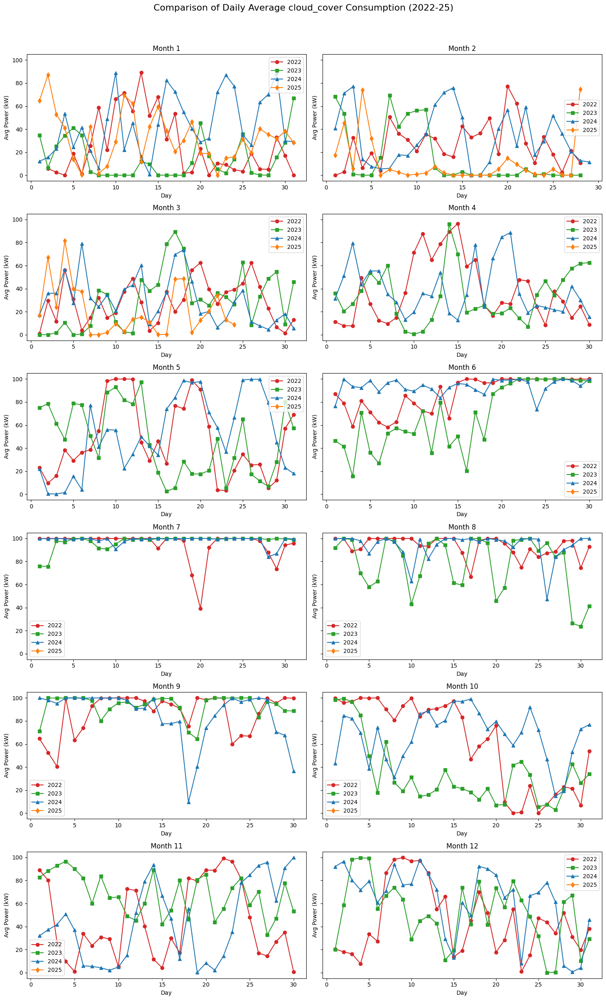

In [ ]:
data=pd.DataFrame(data_power)

# Convert Datetime to datetime format
data['Datetime'] = pd.to_datetime(data['Datetime'])

data['Year'] = data['Datetime'].dt.year
data['Month'] = data['Datetime'].dt.month
data['Day'] = data['Datetime'].dt.day
col='cloud_cover'

# Group by year, month, and day to get daily average power consumption
daily_avg_power = data.groupby(['Year', 'Month', 'Day'])[col].mean().reset_index()

# Split data into two years
year1 = daily_avg_power['Year'].unique()[0]
year2 = daily_avg_power['Year'].unique()[1]
year3 = daily_avg_power['Year'].unique()[2]
year4 = daily_avg_power['Year'].unique()[3]

data_year1 = daily_avg_power[daily_avg_power['Year'] == year1]
data_year2 = daily_avg_power[daily_avg_power['Year'] == year2]
data_year3 = daily_avg_power[daily_avg_power['Year'] == year3]
data_year4 = daily_avg_power[daily_avg_power['Year'] == year4]

# Create combined plot for both years in the same subplot for each month
fig, axes = plt.subplots(6, 2, figsize=(15, 25), sharey=True)
fig.suptitle(f'Comparison of Daily Average {col} Consumption (2022-25)', fontsize=16)

# Create 3-column grid plots for each year
for month in range(1, 13):
    ax = axes[(month - 1) // 2, (month - 1) % 2]
    month_data1 = data_year1[data_year1['Month'] == month]
    month_data2 = data_year2[data_year2['Month'] == month]
    month_data3 = data_year3[data_year3['Month'] == month]
    month_data4 = data_year4[data_year4['Month'] == month]
    ax.plot(month_data1['Day'], month_data1[col], marker='o', label=f'{year1}', color='tab:red')
    ax.plot(month_data2['Day'], month_data2[col], marker='s', label=f'{year2}', color='tab:green')
    ax.plot(month_data3['Day'], month_data3[col], marker='^', label=f'{year3}', color='tab:blue')
    ax.plot(month_data4['Day'], month_data4[col], marker='d', label=f'{year4}', color='tab:orange')

    ax.set_title(f'Month {month}')
    ax.set_xlabel('Day')
    ax.set_ylabel('Avg Power (kW)')
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

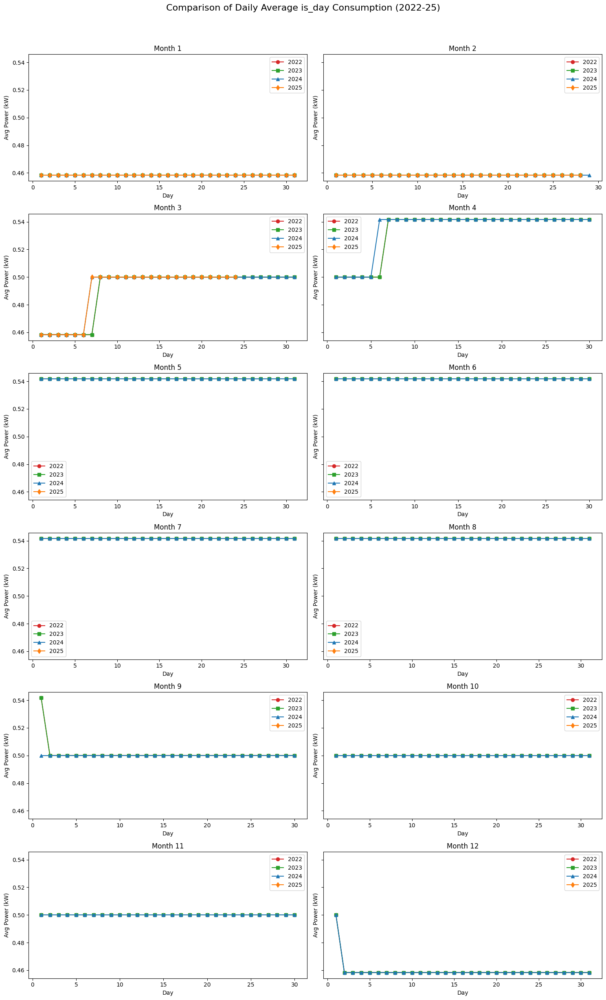

In [ ]:
data=pd.DataFrame(data_power)

# Convert Datetime to datetime format
data['Datetime'] = pd.to_datetime(data['Datetime'])

data['Year'] = data['Datetime'].dt.year
data['Month'] = data['Datetime'].dt.month
data['Day'] = data['Datetime'].dt.day
col='is_day'

# Group by year, month, and day to get daily average power consumption
daily_avg_power = data.groupby(['Year', 'Month', 'Day'])[col].mean().reset_index()

# Split data into two years
year1 = daily_avg_power['Year'].unique()[0]
year2 = daily_avg_power['Year'].unique()[1]
year3 = daily_avg_power['Year'].unique()[2]
year4 = daily_avg_power['Year'].unique()[3]

data_year1 = daily_avg_power[daily_avg_power['Year'] == year1]
data_year2 = daily_avg_power[daily_avg_power['Year'] == year2]
data_year3 = daily_avg_power[daily_avg_power['Year'] == year3]
data_year4 = daily_avg_power[daily_avg_power['Year'] == year4]

# Create combined plot for both years in the same subplot for each month
fig, axes = plt.subplots(6, 2, figsize=(15, 25), sharey=True)
fig.suptitle(f'Comparison of Daily Average {col} Consumption (2022-25)', fontsize=16)

# Create 3-column grid plots for each year
for month in range(1, 13):
    ax = axes[(month - 1) // 2, (month - 1) % 2]
    month_data1 = data_year1[data_year1['Month'] == month]
    month_data2 = data_year2[data_year2['Month'] == month]
    month_data3 = data_year3[data_year3['Month'] == month]
    month_data4 = data_year4[data_year4['Month'] == month]
    ax.plot(month_data1['Day'], month_data1[col], marker='o', label=f'{year1}', color='tab:red')
    ax.plot(month_data2['Day'], month_data2[col], marker='s', label=f'{year2}', color='tab:green')
    ax.plot(month_data3['Day'], month_data3[col], marker='^', label=f'{year3}', color='tab:blue')
    ax.plot(month_data4['Day'], month_data4[col], marker='d', label=f'{year4}', color='tab:orange')

    ax.set_title(f'Month {month}')
    ax.set_xlabel('Day')
    ax.set_ylabel('Avg Power (kW)')
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

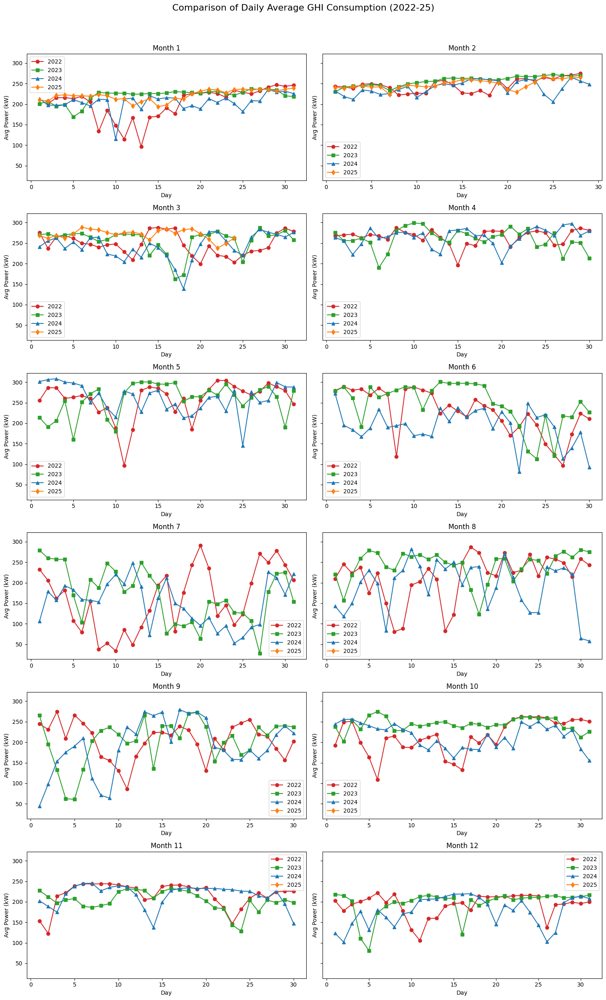

In [ ]:
data=pd.DataFrame(data_power)

# Convert Datetime to datetime format
data['Datetime'] = pd.to_datetime(data['Datetime'])

data['Year'] = data['Datetime'].dt.year
data['Month'] = data['Datetime'].dt.month
data['Day'] = data['Datetime'].dt.day
col='GHI'

# Group by year, month, and day to get daily average power consumption
daily_avg_power = data.groupby(['Year', 'Month', 'Day'])[col].mean().reset_index()

# Split data into two years
year1 = daily_avg_power['Year'].unique()[0]
year2 = daily_avg_power['Year'].unique()[1]
year3 = daily_avg_power['Year'].unique()[2]
year4 = daily_avg_power['Year'].unique()[3]

data_year1 = daily_avg_power[daily_avg_power['Year'] == year1]
data_year2 = daily_avg_power[daily_avg_power['Year'] == year2]
data_year3 = daily_avg_power[daily_avg_power['Year'] == year3]
data_year4 = daily_avg_power[daily_avg_power['Year'] == year4]

# Create combined plot for both years in the same subplot for each month
fig, axes = plt.subplots(6, 2, figsize=(15, 25), sharey=True)
fig.suptitle(f'Comparison of Daily Average {col} Consumption (2022-25)', fontsize=16)

# Create 3-column grid plots for each year
for month in range(1, 13):
    ax = axes[(month - 1) // 2, (month - 1) % 2]
    month_data1 = data_year1[data_year1['Month'] == month]
    month_data2 = data_year2[data_year2['Month'] == month]
    month_data3 = data_year3[data_year3['Month'] == month]
    month_data4 = data_year4[data_year4['Month'] == month]
    ax.plot(month_data1['Day'], month_data1[col], marker='o', label=f'{year1}', color='tab:red')
    ax.plot(month_data2['Day'], month_data2[col], marker='s', label=f'{year2}', color='tab:green')
    ax.plot(month_data3['Day'], month_data3[col], marker='^', label=f'{year3}', color='tab:blue')
    ax.plot(month_data4['Day'], month_data4[col], marker='d', label=f'{year4}', color='tab:orange')

    ax.set_title(f'Month {month}')
    ax.set_xlabel('Day')
    ax.set_ylabel('Avg Power (kW)')
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

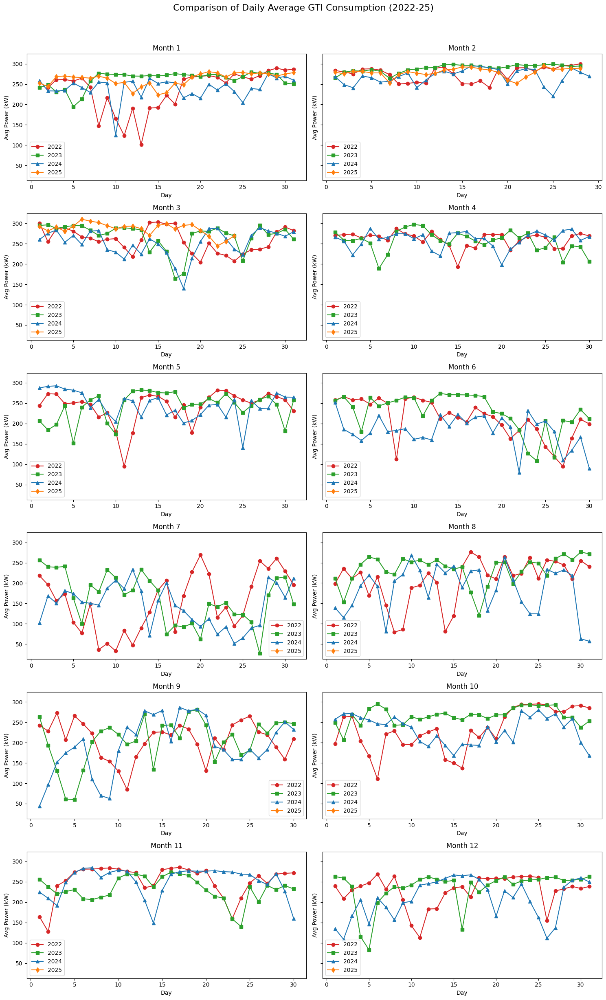

In [ ]:
data=pd.DataFrame(data_power)

# Convert Datetime to datetime format
data['Datetime'] = pd.to_datetime(data['Datetime'])

data['Year'] = data['Datetime'].dt.year
data['Month'] = data['Datetime'].dt.month
data['Day'] = data['Datetime'].dt.day
col='GTI'

# Group by year, month, and day to get daily average power consumption
daily_avg_power = data.groupby(['Year', 'Month', 'Day'])[col].mean().reset_index()

# Split data into two years
year1 = daily_avg_power['Year'].unique()[0]
year2 = daily_avg_power['Year'].unique()[1]
year3 = daily_avg_power['Year'].unique()[2]
year4 = daily_avg_power['Year'].unique()[3]

data_year1 = daily_avg_power[daily_avg_power['Year'] == year1]
data_year2 = daily_avg_power[daily_avg_power['Year'] == year2]
data_year3 = daily_avg_power[daily_avg_power['Year'] == year3]
data_year4 = daily_avg_power[daily_avg_power['Year'] == year4]

# Create combined plot for both years in the same subplot for each month
fig, axes = plt.subplots(6, 2, figsize=(15, 25), sharey=True)
fig.suptitle(f'Comparison of Daily Average {col} Consumption (2022-25)', fontsize=16)

# Create 3-column grid plots for each year
for month in range(1, 13):
    ax = axes[(month - 1) // 2, (month - 1) % 2]
    month_data1 = data_year1[data_year1['Month'] == month]
    month_data2 = data_year2[data_year2['Month'] == month]
    month_data3 = data_year3[data_year3['Month'] == month]
    month_data4 = data_year4[data_year4['Month'] == month]
    ax.plot(month_data1['Day'], month_data1[col], marker='o', label=f'{year1}', color='tab:red')
    ax.plot(month_data2['Day'], month_data2[col], marker='s', label=f'{year2}', color='tab:green')
    ax.plot(month_data3['Day'], month_data3[col], marker='^', label=f'{year3}', color='tab:blue')
    ax.plot(month_data4['Day'], month_data4[col], marker='d', label=f'{year4}', color='tab:orange')

    ax.set_title(f'Month {month}')
    ax.set_xlabel('Day')
    ax.set_ylabel('Avg Power (kW)')
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

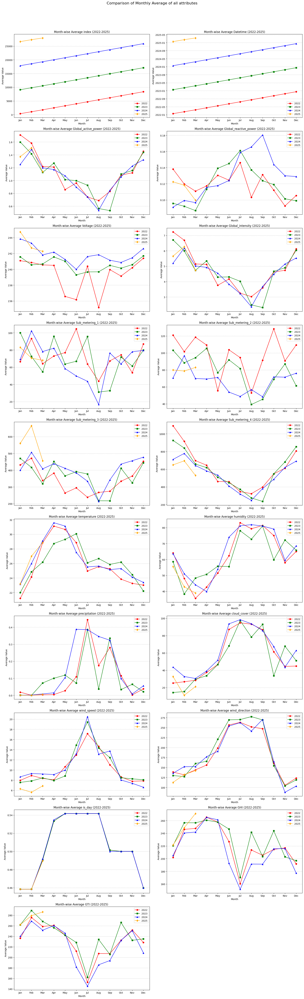

In [ ]:
# Convert 'Datetime' to datetime format
data_power['Datetime'] = pd.to_datetime(data_power['Datetime'])

# Filter data for the year 2022
data_2022 = data_power[data_power['Datetime'].dt.year == 2022]
data_2023 = data_power[data_power['Datetime'].dt.year == 2023]
data_2024 = data_power[data_power['Datetime'].dt.year == 2024]
data_2025 = data_power[data_power['Datetime'].dt.year == 2025]

# Get list of numeric columns to plot
numeric_cols = data_power.columns

# Set up grid layout for plots
num_cols = len(numeric_cols)
rows = (num_cols // 2) + (1 if num_cols % 2 != 0 else 0)

fig, axes = plt.subplots(rows, 2, figsize=(18, 6 * rows))
axes = axes.flatten()
fig.suptitle('Comparison of Monthly Average of all attributes', fontsize=16)

# Plot each column in a grid
for i, col in enumerate(numeric_cols):
    monthly_avg_2022 = data_2022.groupby(data_2022['Datetime'].dt.month)[col].mean()
    monthly_avg_2023 = data_2023.groupby(data_2023['Datetime'].dt.month)[col].mean()
    monthly_avg_2024 = data_2024.groupby(data_2024['Datetime'].dt.month)[col].mean()
    monthly_avg_2025 = data_2025.groupby(data_2025['Datetime'].dt.month)[col].mean()
    
    axes[i].plot(monthly_avg_2022.index, monthly_avg_2022.values, marker='o', linestyle='-', color='red', label='2022')
    axes[i].plot(monthly_avg_2023.index, monthly_avg_2023.values, marker='s', linestyle='-', color='green', label='2023')
    axes[i].plot(monthly_avg_2024.index, monthly_avg_2024.values, marker='^', linestyle='-', color='blue', label='2024')
    axes[i].plot(monthly_avg_2025.index, monthly_avg_2025.values, marker='d', linestyle='-', color='orange', label='2025')

    # Add plot details
    axes[i].set_title(f'Month-wise Average {col} (2022-2025)')
    axes[i].set_xlabel('Month')
    axes[i].set_ylabel('Average Value')
    axes[i].set_xticks(range(1, 13))
    axes[i].set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                              'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    axes[i].grid(axis='y', linestyle='--', alpha=0.7)
    axes[i].legend()

# Hide any empty subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()